In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import matplotlib.pyplot as plt
import seaborn as sns

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/data-storm-6-0/sample_submission_storming_round.csv
/kaggle/input/data-storm-6-0/train_storming_round.csv
/kaggle/input/data-storm-6-0/test_storming_round.csv


In [2]:
df = pd.read_csv('/kaggle/input/data-storm-6-0/train_storming_round.csv')
test = pd.read_csv('/kaggle/input/data-storm-6-0/test_storming_round.csv')
submission = pd.read_csv('/kaggle/input/data-storm-6-0/sample_submission_storming_round.csv')

# Examine Dataframe

In [3]:
df.shape

(15308, 23)

In [4]:
test.shape

(914, 23)

In [5]:
duplicates = df[df.drop(columns=['row_id', 'agent_code']).duplicated()]
duplicates

,row_id,agent_code,agent_age,agent_join_month,first_policy_sold_month,year_month,unique_proposals_last_7_days,unique_proposals_last_15_days,unique_proposals_last_21_days,unique_proposal,...,unique_quotations,unique_customers_last_7_days,unique_customers_last_15_days,unique_customers_last_21_days,unique_customers,new_policy_count,ANBP_value,net_income,number_of_policy_holders,number_of_cash_payment_policies


## Agent Count

In [6]:
df['agent_code'].nunique()

905

In [7]:
test['agent_code'].nunique()

914

There are few agents newly appear on test dataset. 

In [8]:
# Assuming your dataframes are named df and test_df
df_agent_codes = pd.Series(df['agent_code'].unique())
test_agent_codes = pd.Series(test['agent_code'].unique())

# Find agent codes in test_df but not in df
missing_in_df = test_agent_codes[~test_agent_codes.isin(df_agent_codes)]

print("Agent codes present in test dataset but not in df dataframe:")
print(missing_in_df)

Agent codes present in test dataset but not in df dataframe:
148    6a0d02ea
300    d8e13589
352    3f4c6d56
388    335b4b20
559    f9f0169c
643    c37f2ebf
682    b5338672
793    5444f88c
889    421aec8b
dtype: object


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15308 entries, 0 to 15307
Data columns (total 23 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   row_id                           15308 non-null  int64 
 1   agent_code                       15308 non-null  object
 2   agent_age                        15308 non-null  int64 
 3   agent_join_month                 15308 non-null  object
 4   first_policy_sold_month          15308 non-null  object
 5   year_month                       15308 non-null  object
 6   unique_proposals_last_7_days     15308 non-null  int64 
 7   unique_proposals_last_15_days    15308 non-null  int64 
 8   unique_proposals_last_21_days    15308 non-null  int64 
 9   unique_proposal                  15308 non-null  int64 
 10  unique_quotations_last_7_days    15308 non-null  int64 
 11  unique_quotations_last_15_days   15308 non-null  int64 
 12  unique_quotations_last_21_days  

# Optimize

In [10]:
# Optimize integer columns (check value ranges first)
def optimize(df):
    int_columns = df.select_dtypes(include=['int64']).columns
    
    for col in int_columns:
        col_min = df[col].min()
        col_max = df[col].max()
        if col_min >= 0:
            if col_max < 255:
                df[col] = df[col].astype(np.uint8)
            elif col_max < 65535:
                df[col] = df[col].astype(np.uint16)
            elif col_max < 4294967295:
                df[col] = df[col].astype(np.uint32)
        else:
            if np.iinfo(np.int8).min <= col_min <= np.iinfo(np.int8).max:
                df[col] = df[col].astype(np.int8)
            elif np.iinfo(np.int16).min <= col_min <= np.iinfo(np.int16).max:
                df[col] = df[col].astype(np.int16)
            elif np.iinfo(np.int32).min <= col_min <= np.iinfo(np.int32).max:
                df[col] = df[col].astype(np.int32)
    
    # Convert datetime fields
    df['agent_join_month'] = pd.to_datetime(df['agent_join_month'], format='%m/%d/%Y')
    df['first_policy_sold_month'] = pd.to_datetime(df['first_policy_sold_month'], format='%m/%d/%Y')
    df['year_month'] = pd.to_datetime(df['year_month'], format='%m/%d/%Y')

    return df

df = optimize(df)
test = optimize(test)

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15308 entries, 0 to 15307
Data columns (total 23 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   row_id                           15308 non-null  uint16        
 1   agent_code                       15308 non-null  object        
 2   agent_age                        15308 non-null  uint8         
 3   agent_join_month                 15308 non-null  datetime64[ns]
 4   first_policy_sold_month          15308 non-null  datetime64[ns]
 5   year_month                       15308 non-null  datetime64[ns]
 6   unique_proposals_last_7_days     15308 non-null  uint8         
 7   unique_proposals_last_15_days    15308 non-null  uint8         
 8   unique_proposals_last_21_days    15308 non-null  uint8         
 9   unique_proposal                  15308 non-null  uint8         
 10  unique_quotations_last_7_days    15308 non-null  uint8    

# Extract New Features

In [12]:
df.columns

Index(['row_id', 'agent_code', 'agent_age', 'agent_join_month',
       'first_policy_sold_month', 'year_month', 'unique_proposals_last_7_days',
       'unique_proposals_last_15_days', 'unique_proposals_last_21_days',
       'unique_proposal', 'unique_quotations_last_7_days',
       'unique_quotations_last_15_days', 'unique_quotations_last_21_days',
       'unique_quotations', 'unique_customers_last_7_days',
       'unique_customers_last_15_days', 'unique_customers_last_21_days',
       'unique_customers', 'new_policy_count', 'ANBP_value', 'net_income',
       'number_of_policy_holders', 'number_of_cash_payment_policies'],
      dtype='object')

In [13]:
def feature_eng(df):
    # Extract year and month from agent join date
    df['agent_join_year'] = df['agent_join_month'].dt.year
    df['agent_join_month_num'] = df['agent_join_month'].dt.month
    
    # Extract year and month from first policy sold date
    df['first_policy_year'] = df['first_policy_sold_month'].dt.year
    df['first_policy_month_num'] = df['first_policy_sold_month'].dt.month
    
    # Extract year and month from the year_month column
    df['record_year'] = df['year_month'].dt.year
    df['record_month'] = df['year_month'].dt.month
    
    # 1. Conversion Rate Features
    df['proposal_to_policy_ratio'] = df['unique_proposal'] / df['new_policy_count'].replace(0, 1)
    df['quotation_to_policy_ratio'] = df['unique_quotations'] / df['new_policy_count'].replace(0, 1)
    df['customer_to_policy_ratio'] = df['unique_customers'] / df['new_policy_count'].replace(0, 1)
    df['proposal_to_quotation_ratio'] = df['unique_quotations'] / df['unique_proposal'].replace(0, 1)
    df['quotation_to_customer_ratio'] = df['unique_customers'] / df['unique_quotations'].replace(0, 1)
    
    # 2. Time-Based Features
    # Calculate how many months since agent joined
    df['months_since_join'] = ((df['year_month'].dt.year - df['agent_join_month'].dt.year) * 12 +
                               (df['year_month'].dt.month - df['agent_join_month'].dt.month))
    
    # Calculate how long it took for agent to sell first policy
    df['months_to_first_sale'] = ((df['first_policy_sold_month'].dt.year - df['agent_join_month'].dt.year) * 12 +
                                  (df['first_policy_sold_month'].dt.month - df['agent_join_month'].dt.month))
    df['months_since_first_sale'] = (df['year_month'] - df['first_policy_sold_month']).dt.days / 30
    
    # 3. Activity Trend Features
    df['recent_proposal_ratio'] = df['unique_proposals_last_7_days'] / df['unique_proposal'].replace(0, 1)
    df['recent_quotation_ratio'] = df['unique_quotations_last_7_days'] / df['unique_quotations'].replace(0, 1)
    df['recent_customer_ratio'] = df['unique_customers_last_7_days'] / df['unique_customers'].replace(0, 1)
    
    # 4. Productivity Features
    df['ANBP_per_policy'] = df['ANBP_value'] / df['new_policy_count'].replace(0, 1)
    df['income_per_policy'] = df['net_income'] / df['new_policy_count'].replace(0, 1)
    df['income_per_customer'] = df['net_income'] / df['unique_customers'].replace(0, 1)
    df['cash_payment_ratio'] = df['number_of_cash_payment_policies'] / df['new_policy_count'].replace(0, 1)

    # New combined features based on high MI score variables
    df['cash_policy_to_proposal_ratio'] = df['number_of_cash_payment_policies'] / df['unique_proposal'].replace(0, np.nan)
    df['ANBP_per_proposal'] = df['ANBP_value'] / df['unique_proposal'].replace(0, np.nan)
    df['ANBP_per_cash_policy'] = df['ANBP_value'] / df['number_of_cash_payment_policies'].replace(0, np.nan)
    
    # Create a feature combining top factors
    df['top_feature_combo'] = (
        df['number_of_cash_payment_policies'] * 
        df['unique_proposal'] * 
        df['ANBP_value'] / 
        (df['unique_proposal'] + 1)
    )
    
    # Net income appears relevant
    if 'net_income' in df.columns:
        df['income_per_proposal'] = df['net_income'] / df['unique_proposal'].replace(0, np.nan)
        df['income_per_cash_policy'] = df['net_income'] / df['number_of_cash_payment_policies'].replace(0, np.nan)
    
    # Only include agent features with some signal
    if 'agent_code' in df.columns and 'new_policy_count' in df.columns:
        # Average monthly sales (the alt version had slightly higher MI)
        agent_monthly_avg = (
            df.groupby('agent_code')['new_policy_count']
            .mean()
            .reset_index(name='avg_monthly_sales')
        )
        agent_monthly_avg_dict = dict(zip(agent_monthly_avg['agent_code'], agent_monthly_avg['avg_monthly_sales']))
        df['agent_avg_monthly_sales_alt'] = df['agent_code'].map(agent_monthly_avg_dict)

    # Fill NaN values with 0 or another appropriate value
    df = df.fillna(0)
    
    return df

df = feature_eng(df)
test = feature_eng(test)

In [14]:
df.columns

Index(['row_id', 'agent_code', 'agent_age', 'agent_join_month',
       'first_policy_sold_month', 'year_month', 'unique_proposals_last_7_days',
       'unique_proposals_last_15_days', 'unique_proposals_last_21_days',
       'unique_proposal', 'unique_quotations_last_7_days',
       'unique_quotations_last_15_days', 'unique_quotations_last_21_days',
       'unique_quotations', 'unique_customers_last_7_days',
       'unique_customers_last_15_days', 'unique_customers_last_21_days',
       'unique_customers', 'new_policy_count', 'ANBP_value', 'net_income',
       'number_of_policy_holders', 'number_of_cash_payment_policies',
       'agent_join_year', 'agent_join_month_num', 'first_policy_year',
       'first_policy_month_num', 'record_year', 'record_month',
       'proposal_to_policy_ratio', 'quotation_to_policy_ratio',
       'customer_to_policy_ratio', 'proposal_to_quotation_ratio',
       'quotation_to_customer_ratio', 'months_since_join',
       'months_to_first_sale', 'months_since_fi

In [15]:
# Function to convert date columns to cyclic encoding and drop originals
def cyclic_encode_dates(df, date_columns):
    df_copy = df.copy()
    
    for col in date_columns:
        
        # Extract month (1-12) and convert to cyclic features
        month = df_copy[col].dt.month
        df_copy[f'{col}_sin'] = np.sin(2 * np.pi * month / 12)
        df_copy[f'{col}_cos'] = np.cos(2 * np.pi * month / 12)
        
        
    # Drop all original date columns
    df_copy = df_copy.drop(columns=date_columns)
    
    return df_copy

# Apply to both train and test datasets
date_columns = ['year_month', 'agent_join_month', 'first_policy_sold_month']
df_encoded = cyclic_encode_dates(df, date_columns)
test_encoded = cyclic_encode_dates(test, date_columns)

In [16]:
from sklearn.preprocessing import LabelEncoder

# Function to encode agent_code consistently across dataframes
def encode_agent_codes(train_df, test_df, agent_col='agent_code'):
    # Create a copy of the dataframes to avoid modifying the originals
    train_encoded = train_df.copy()
    test_encoded = test_df.copy()
    
    # Combine unique agent codes from both dataframes to ensure consistent encoding
    all_agents = pd.concat([train_df[agent_col], test_df[agent_col]]).unique()
    
    # Create and fit the encoder on all unique agent codes
    encoder = LabelEncoder()
    encoder.fit(all_agents)
    
    # Transform the agent codes in both dataframes
    train_encoded[f'{agent_col}_encoded'] = encoder.transform(train_df[agent_col])
    test_encoded[f'{agent_col}_encoded'] = encoder.transform(test_df[agent_col])
    
    # Create a mapping dictionary for reference (optional)
    agent_mapping = dict(zip(encoder.classes_, encoder.transform(encoder.classes_)))
    
    # Drop the original string column
    train_encoded = train_encoded.drop(columns=[agent_col])
    test_encoded = test_encoded.drop(columns=[agent_col])
    
    return train_encoded, test_encoded, agent_mapping

# Apply the encoding
df_encoded, test_encoded, agent_mapping = encode_agent_codes(df_encoded, test_encoded)


# EDA Part 

## 1. Summery Statistics

In [17]:
numeric_cols = df[[ 'agent_age', 'unique_proposals_last_7_days',
       'unique_proposals_last_15_days', 'unique_proposals_last_21_days',
       'unique_proposal', 'unique_quotations_last_7_days',
       'unique_quotations_last_15_days', 'unique_quotations_last_21_days',
       'unique_quotations', 'unique_customers_last_7_days',
       'unique_customers_last_15_days', 'unique_customers_last_21_days',
       'unique_customers', 'new_policy_count', 'ANBP_value', 'net_income',
       'number_of_policy_holders', 'number_of_cash_payment_policies',
                  
         'record_year', 'record_month',
       'proposal_to_policy_ratio', 'quotation_to_policy_ratio',
       'customer_to_policy_ratio', 'proposal_to_quotation_ratio',
       'quotation_to_customer_ratio', 'months_since_join',
       'months_to_first_sale', 'months_since_first_sale',
       'recent_proposal_ratio', 'recent_quotation_ratio',
       'recent_customer_ratio', 'ANBP_per_policy', 'income_per_policy',
       'income_per_customer', 'cash_payment_ratio',
       'cash_policy_to_proposal_ratio', 'ANBP_per_proposal',
       'ANBP_per_cash_policy', 'top_feature_combo', 'income_per_proposal',
       'income_per_cash_policy', 'agent_avg_monthly_sales_alt']]

In [18]:
summary_stats = numeric_cols.describe()
summary_stats

,agent_age,unique_proposals_last_7_days,unique_proposals_last_15_days,unique_proposals_last_21_days,unique_proposal,unique_quotations_last_7_days,unique_quotations_last_15_days,unique_quotations_last_21_days,unique_quotations,unique_customers_last_7_days,...,income_per_policy,income_per_customer,cash_payment_ratio,cash_policy_to_proposal_ratio,ANBP_per_proposal,ANBP_per_cash_policy,top_feature_combo,income_per_proposal,income_per_cash_policy,agent_avg_monthly_sales_alt
count,15308.000000,15308.000000,15308.000000,15308.000000,15308.000000,15308.000000,15308.000000,15308.000000,15308.000000,15308.000000,...,1.530800e+04,15308.000000,15308.000000,15308.000000,15308.000000,15308.000000,1.530800e+04,15308.000000,15308.000000,15308.000000
mean,40.585772,1.491246,2.991116,10.045728,17.516527,1.989679,2.996538,4.469624,13.922394,2.995493,...,3.151406e+04,16459.041721,14.316697,6.052086,61493.542619,12790.840805,5.689546e+07,13669.314545,2859.073026,20.269990
std,11.688204,1.119554,2.001613,6.037296,6.616954,1.420996,2.004386,2.875329,4.663777,1.644117,...,8.461618e+04,15367.652446,37.993173,4.215006,45393.812537,17296.357858,5.785223e+07,9720.297579,3801.752281,2.281511
min,20.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,1.134412e+02,95.368421,0.000000,0.000000,0.000000,0.000000,0.000000e+00,142.851852,0.000000,6.000000
25%,31.000000,0.000000,1.000000,5.000000,12.000000,1.000000,1.000000,2.000000,11.000000,2.000000,...,5.154451e+03,5993.033333,2.000000,2.583333,22440.316667,1577.150000,6.390025e+06,6013.904605,613.689560,18.857143
50%,41.000000,1.000000,3.000000,10.000000,17.000000,2.000000,3.000000,4.000000,14.000000,3.000000,...,1.021925e+04,12556.510417,5.000000,5.809091,58465.782069,7713.125000,3.926653e+07,11946.261905,1661.286565,20.300000
75%,51.000000,2.000000,5.000000,15.000000,23.000000,3.000000,5.000000,7.000000,17.000000,4.000000,...,1.704879e+04,22432.826923,8.000000,9.142857,94632.200630,15426.750000,9.230836e+07,19308.251923,3371.347222,21.750000
max,60.000000,3.000000,6.000000,20.000000,34.000000,4.000000,6.000000,9.000000,32.000000,6.000000,...,1.008836e+06,266637.000000,324.000000,90.000000,544071.000000,99837.000000,3.152436e+08,113562.000000,29479.472222,34.000000


/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


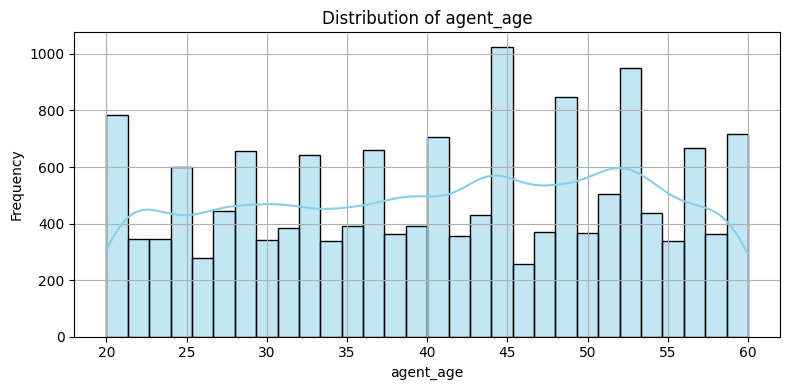

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


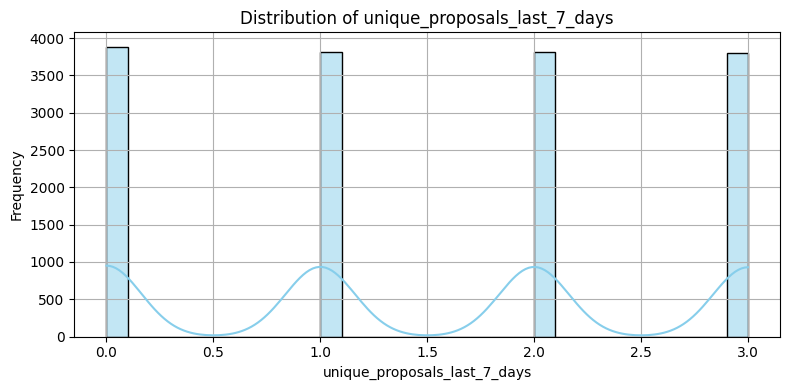

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


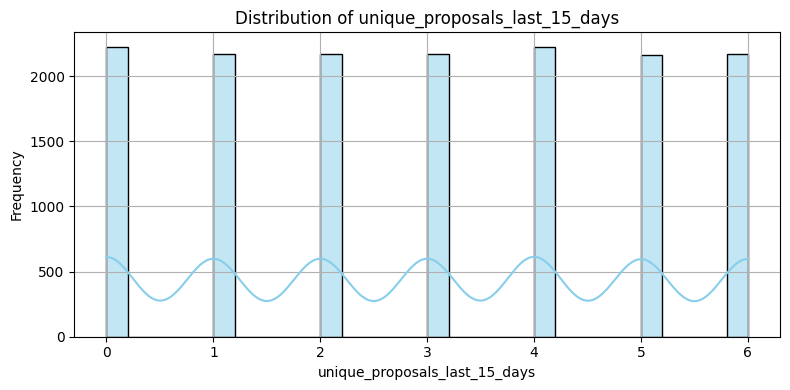

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


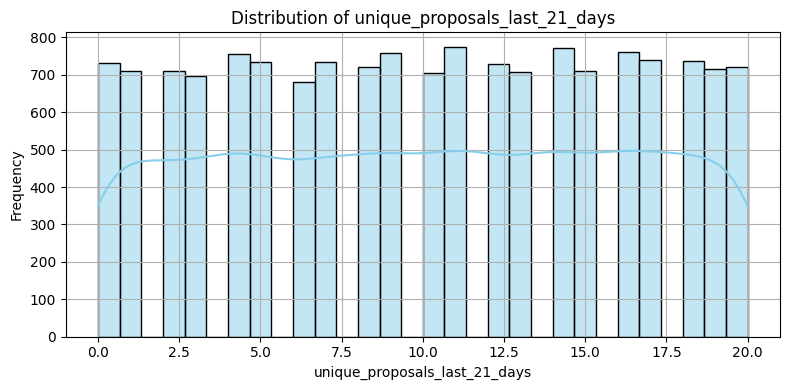

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


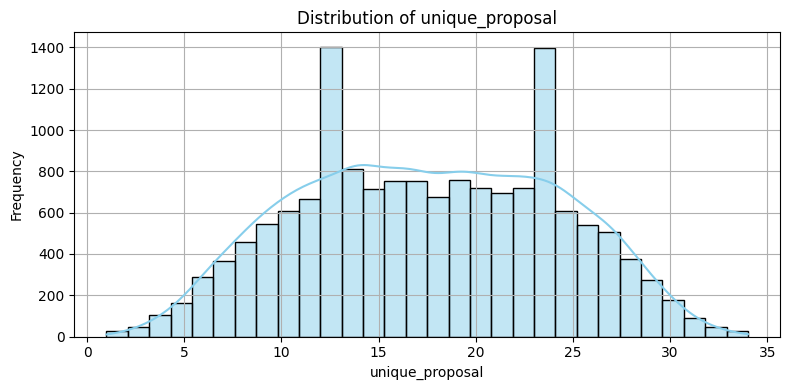

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


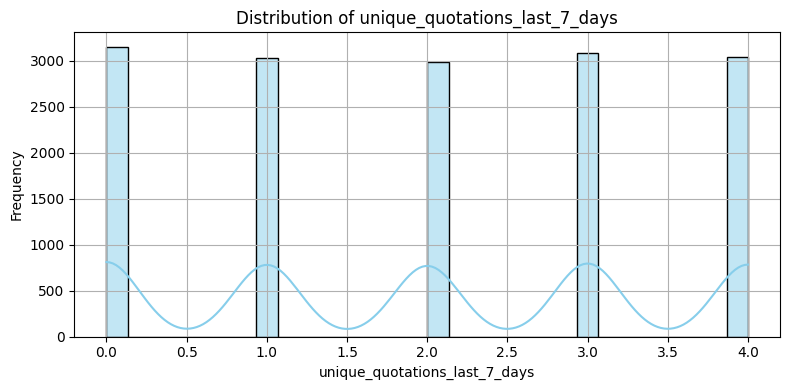

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


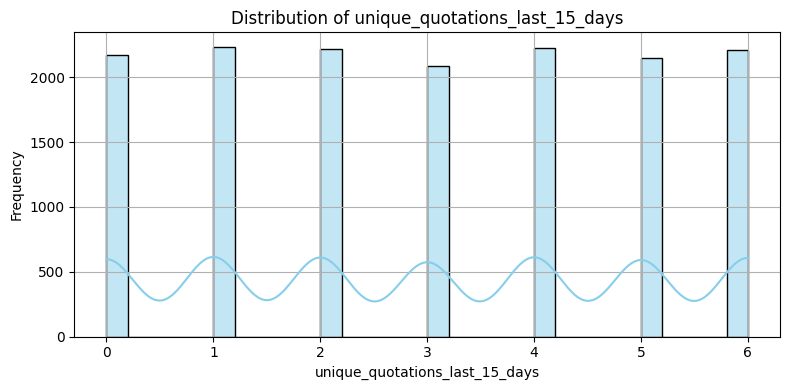

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


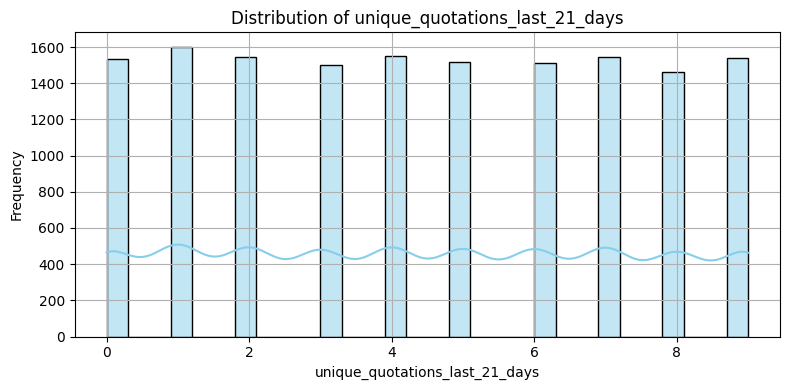

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


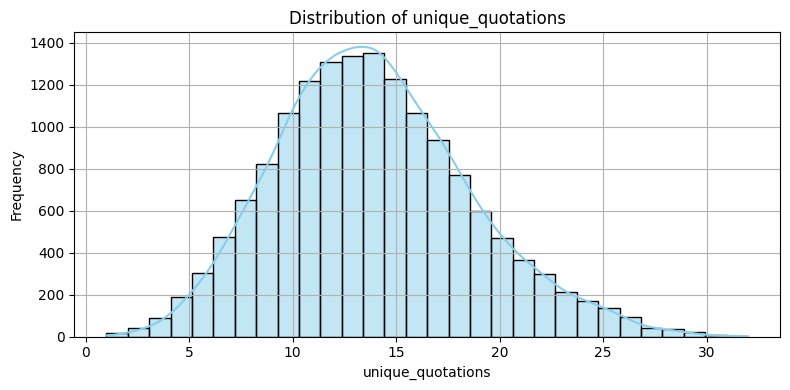

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


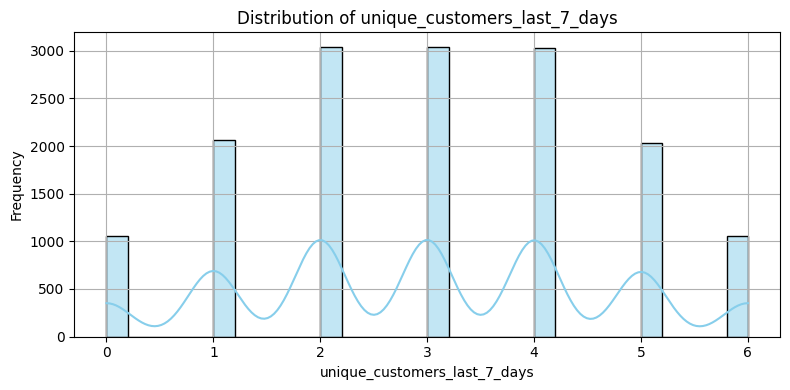

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


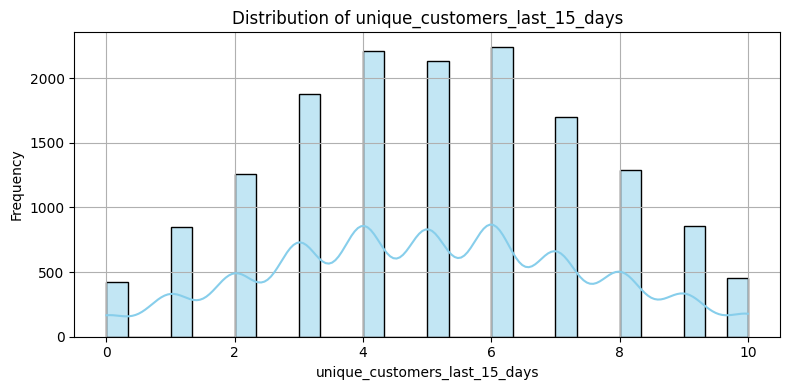

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


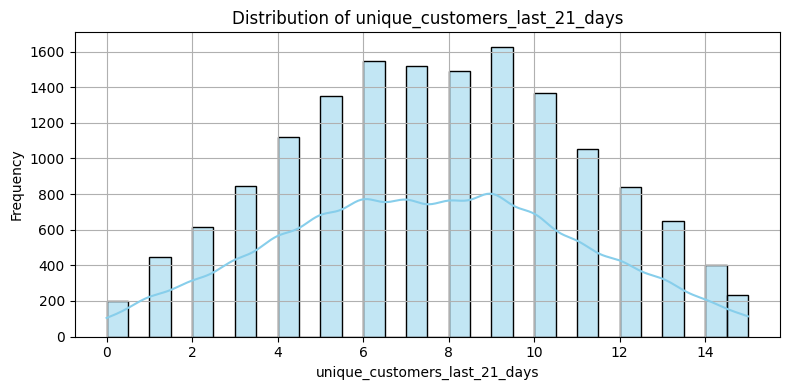

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


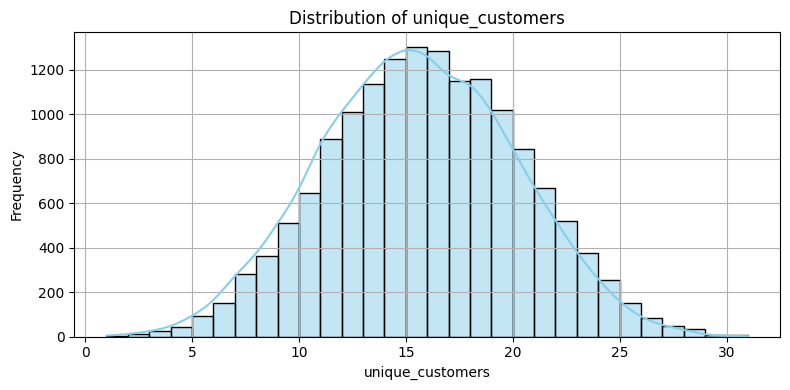

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


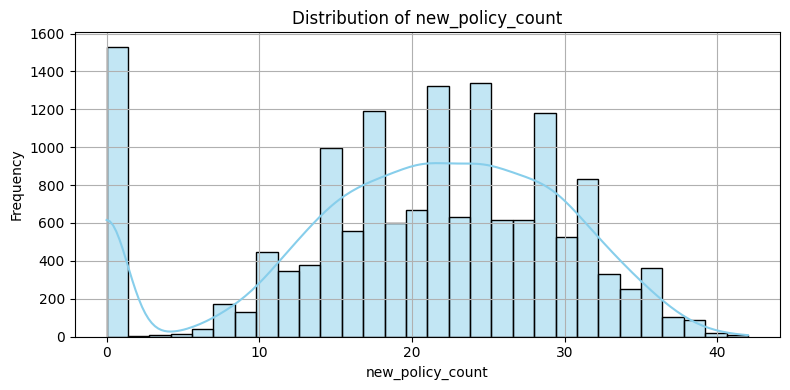

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


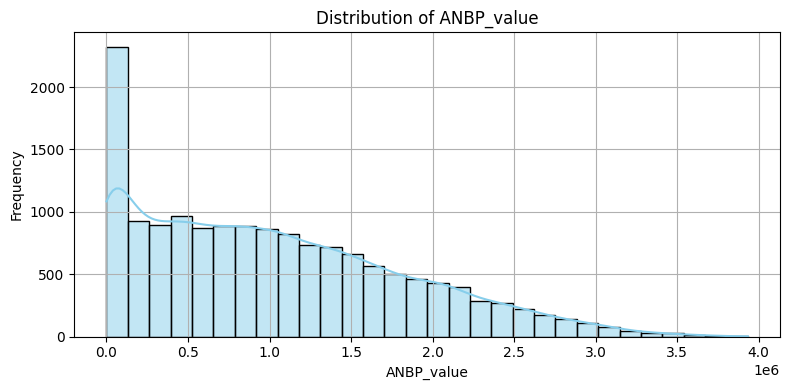

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


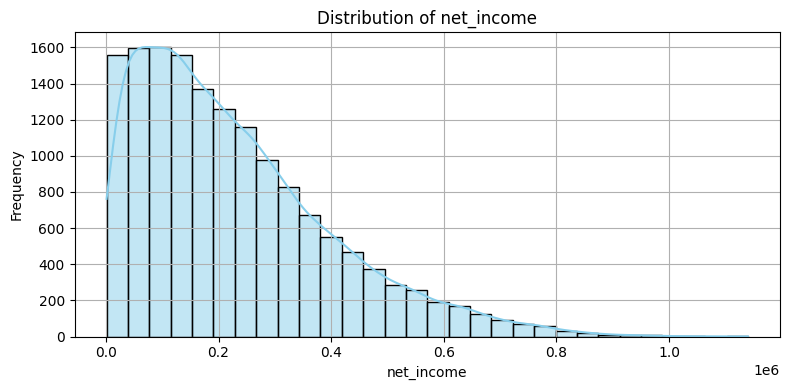

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


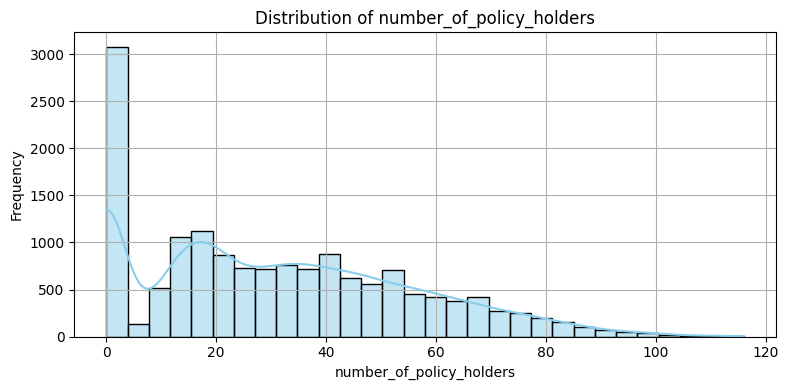

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


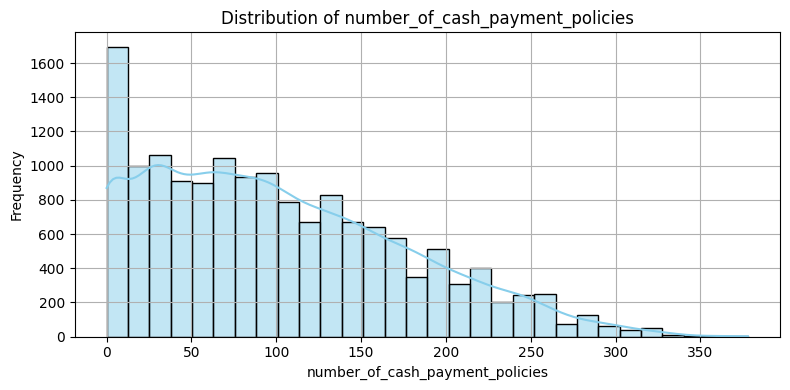

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


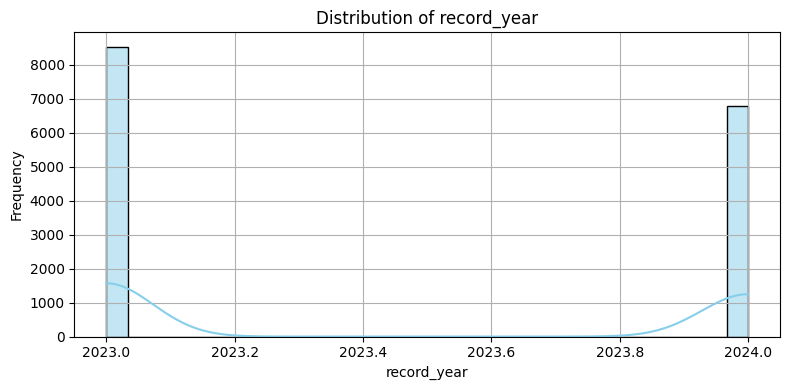

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


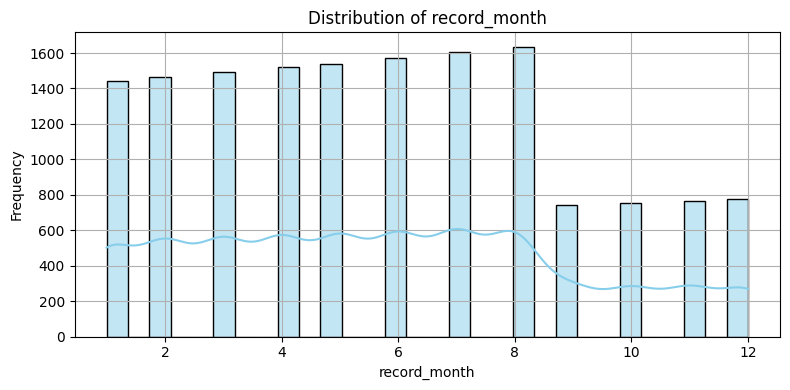

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


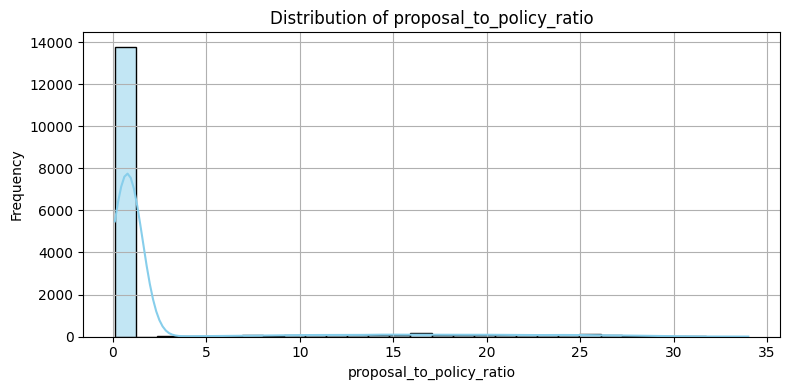

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


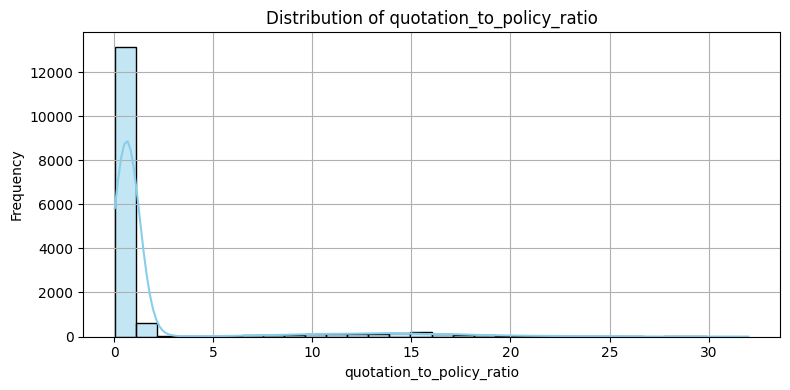

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


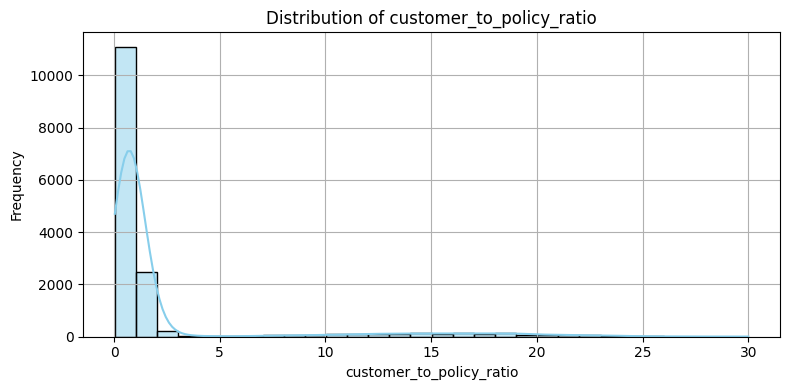

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


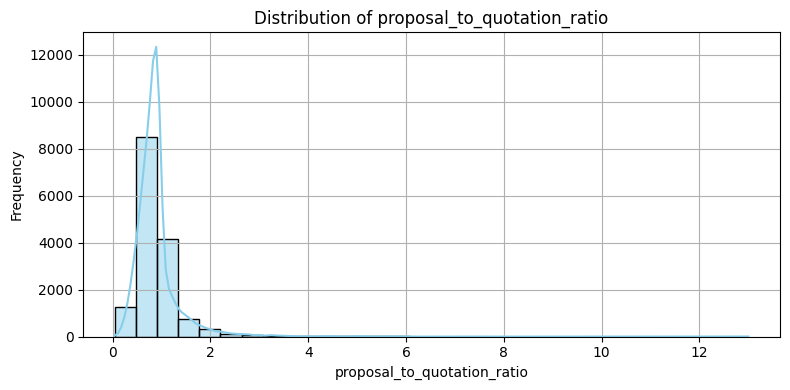

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


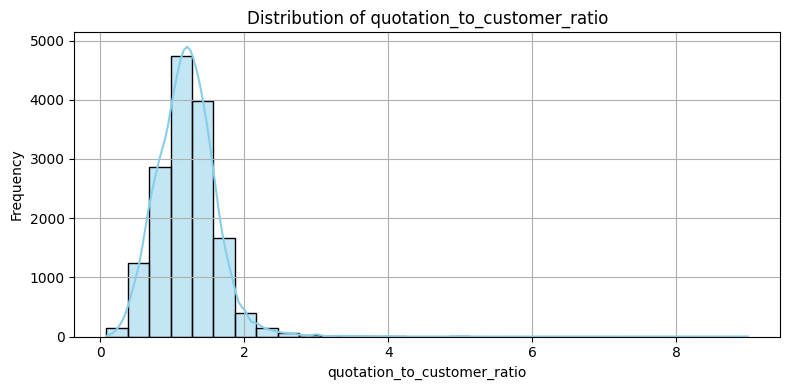

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


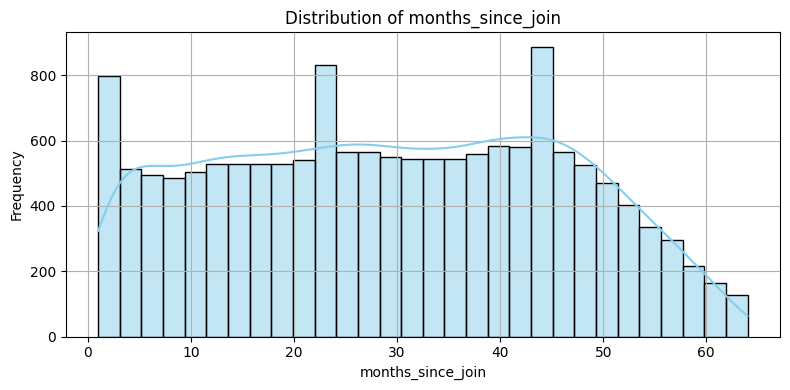

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


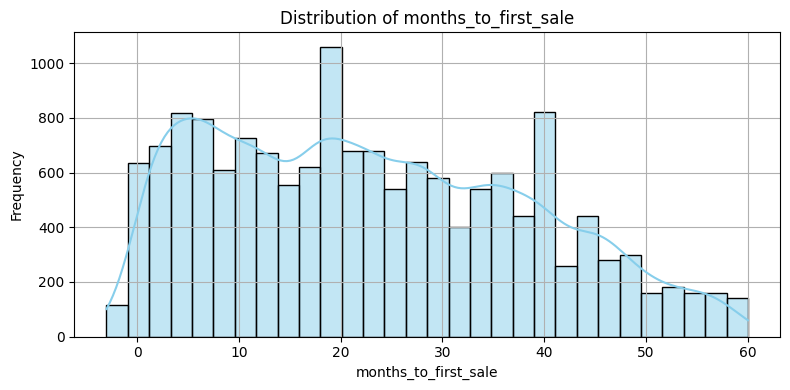

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


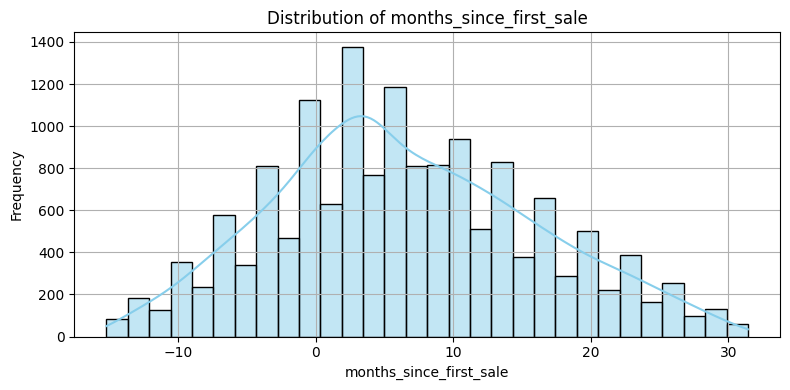

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


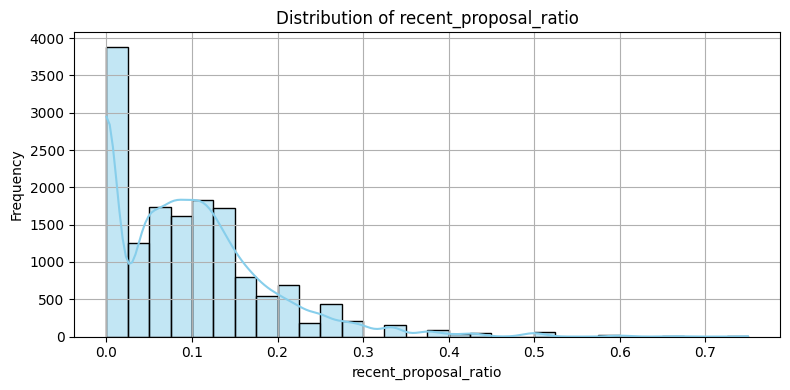

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


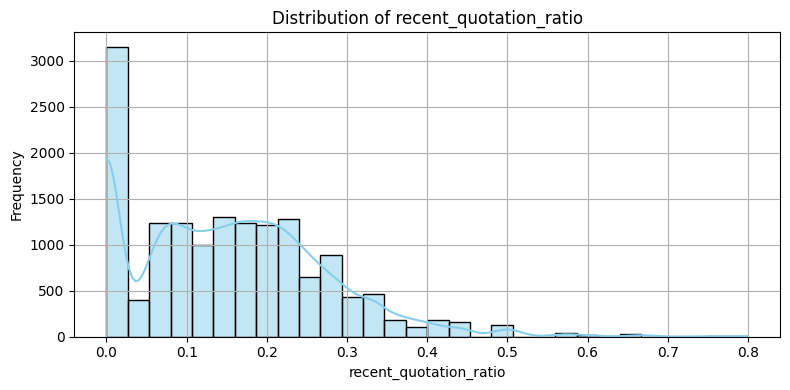

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


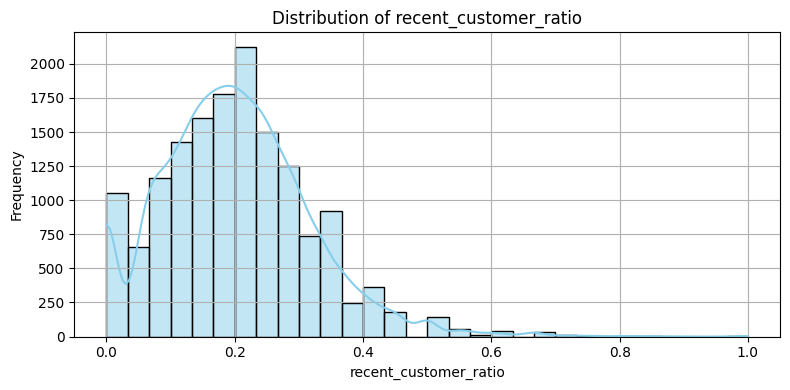

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


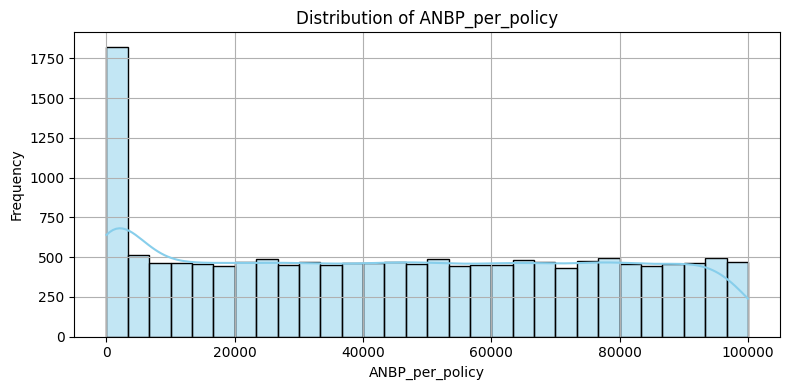

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


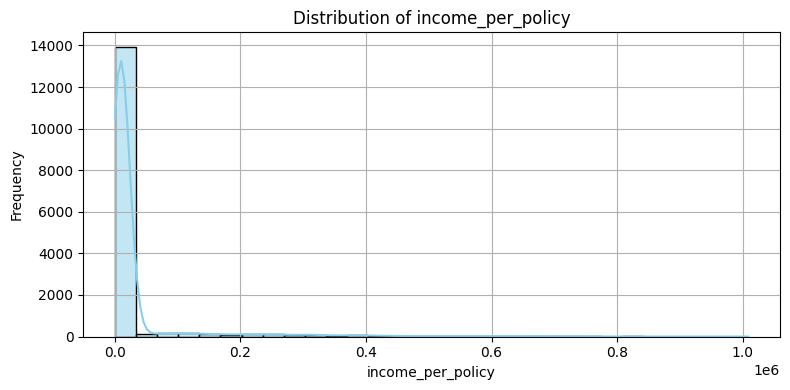

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


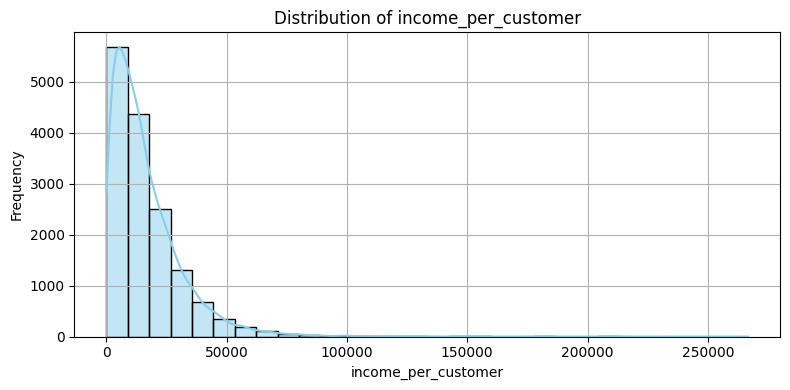

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


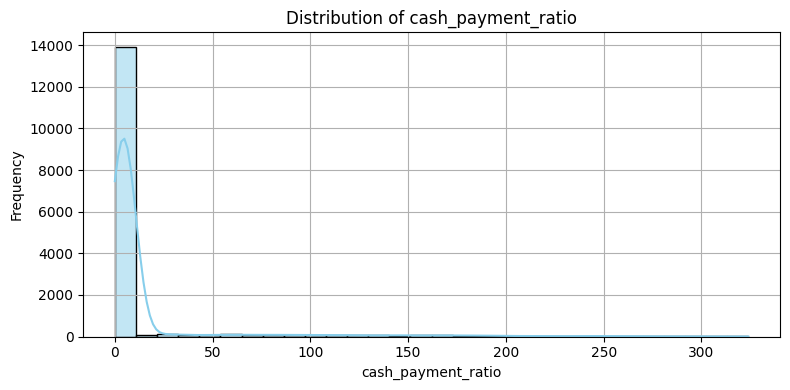

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


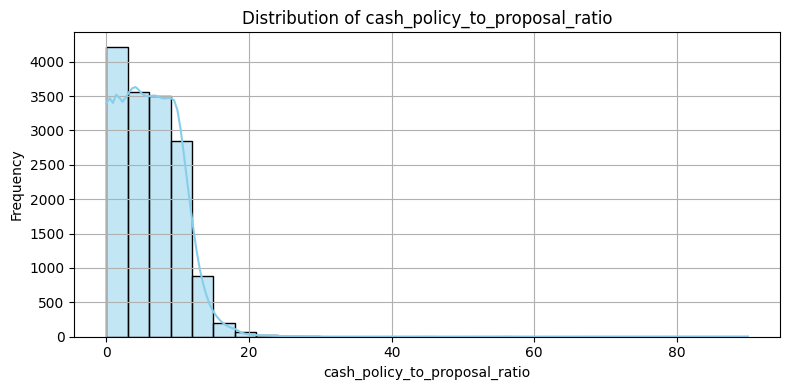

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


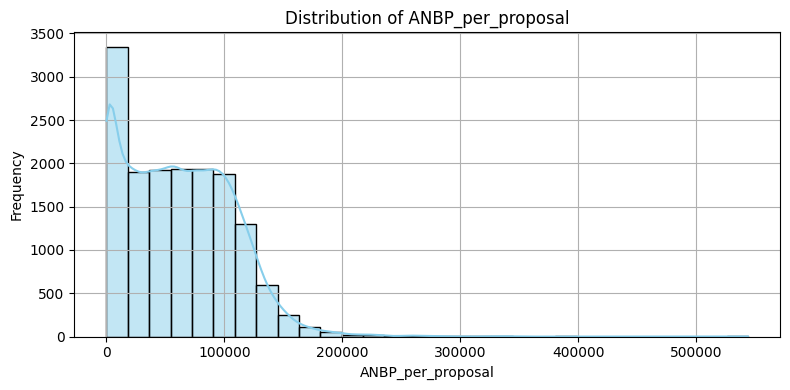

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


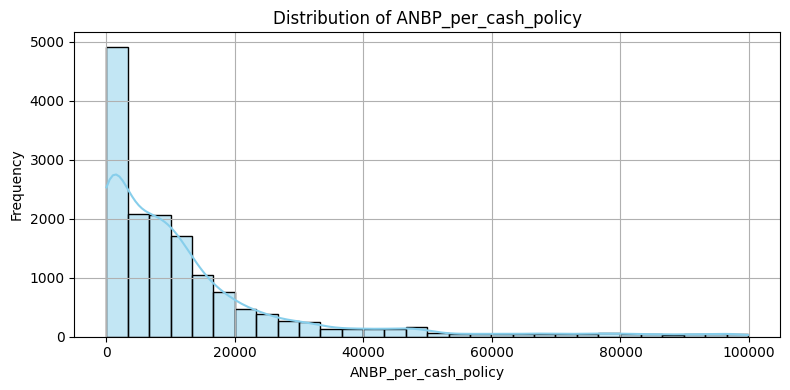

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


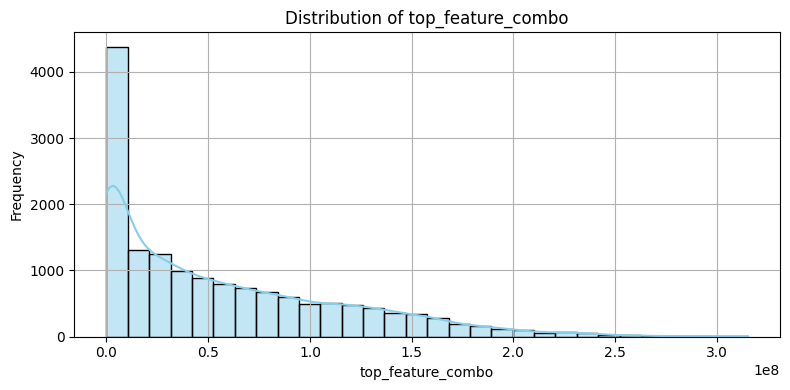

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


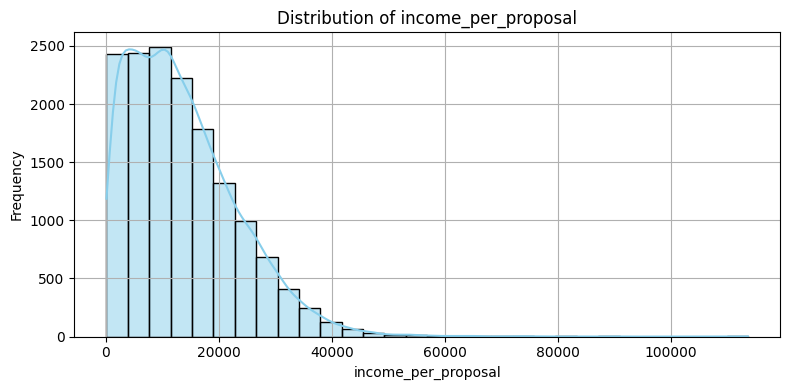

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


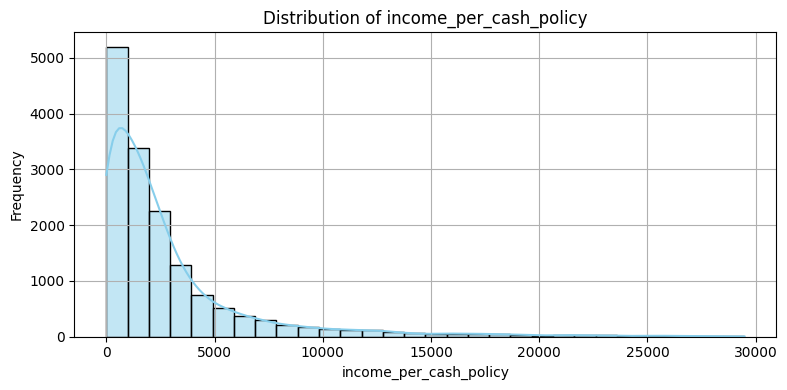

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


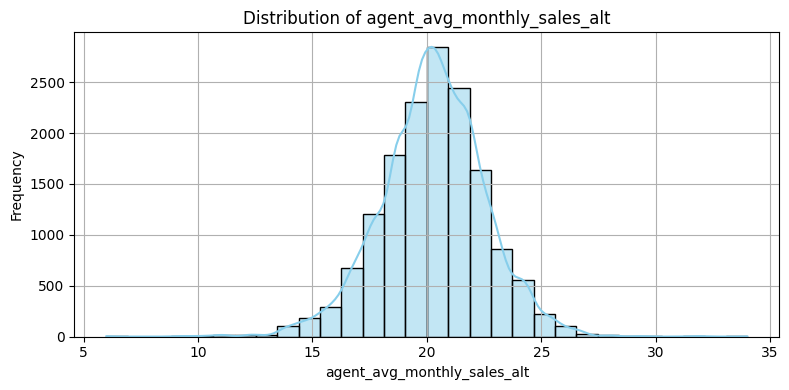

In [19]:
for col in numeric_cols:
    plt.figure(figsize=(8, 4))
    sns.histplot(df[col].dropna(), kde=True, bins=30, color='skyblue')
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.tight_layout()
    plt.show()


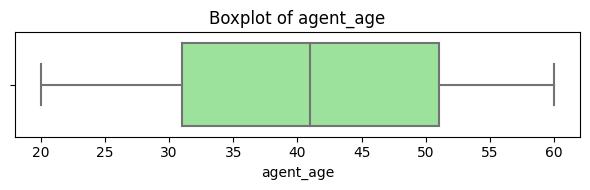

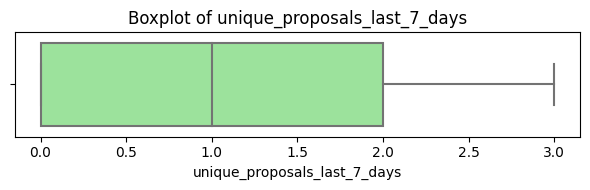

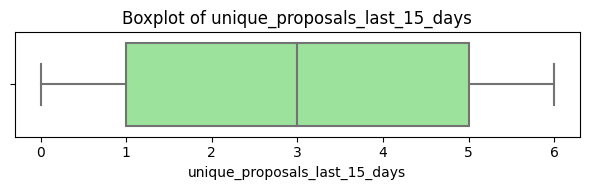

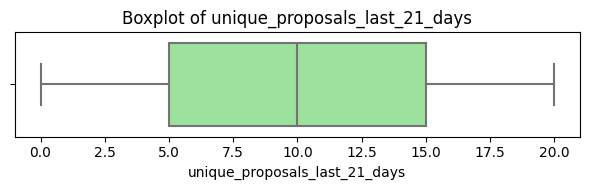

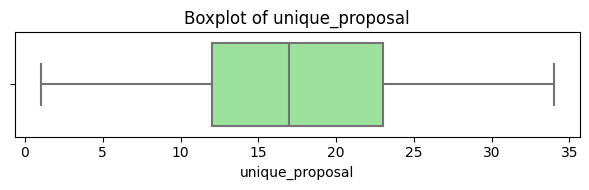

...

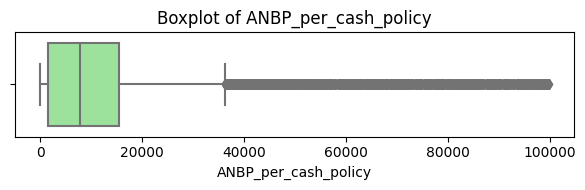

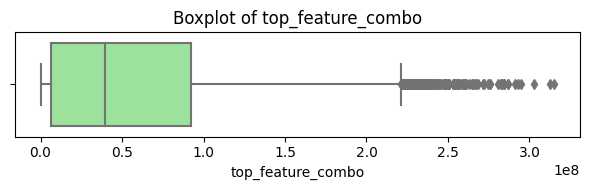

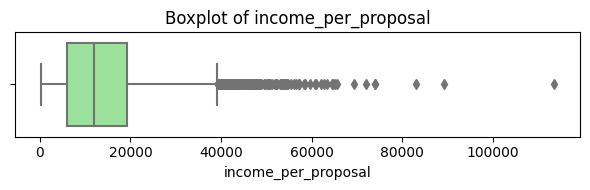

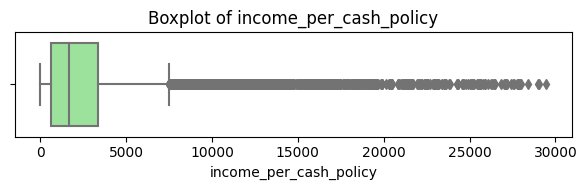

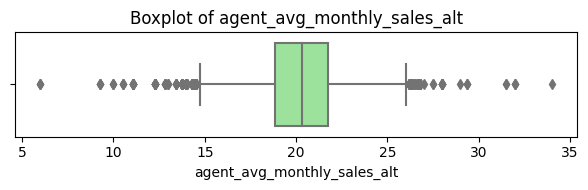

In [20]:
for col in numeric_cols:
    plt.figure(figsize=(6, 2))
    sns.boxplot(x=df[col], color='lightgreen')
    plt.title(f'Boxplot of {col}')
    plt.tight_layout()
    plt.show()


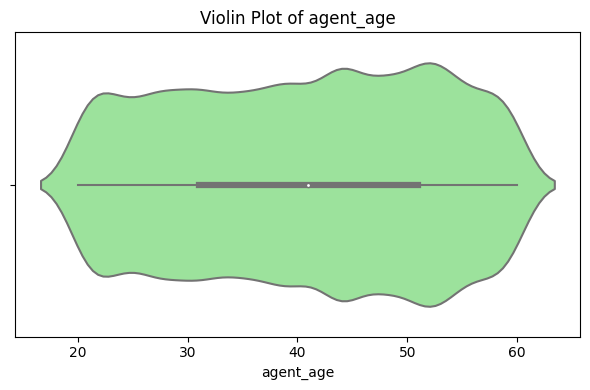

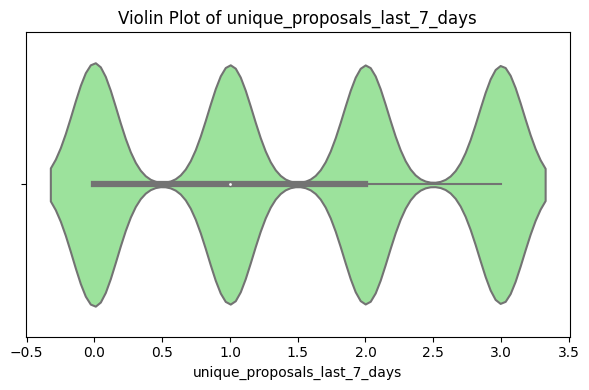

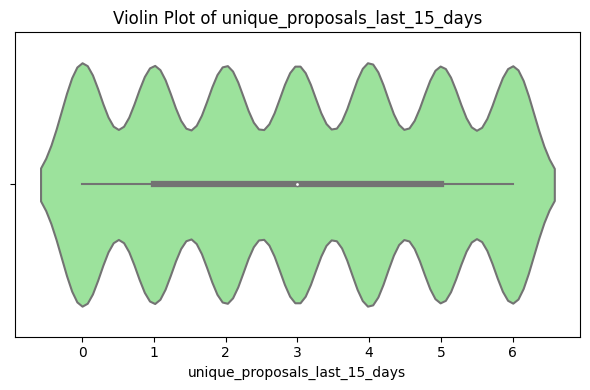

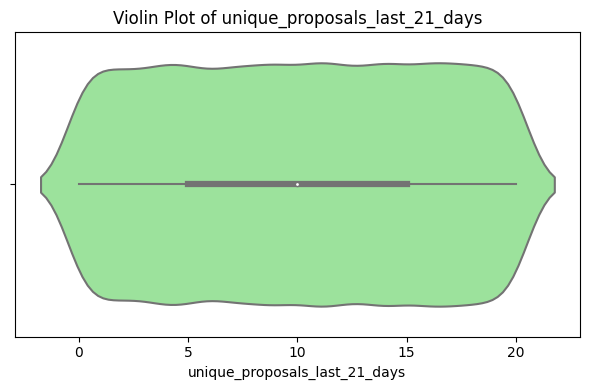

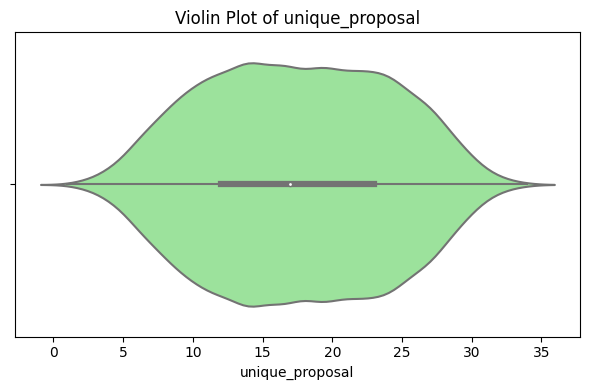

...

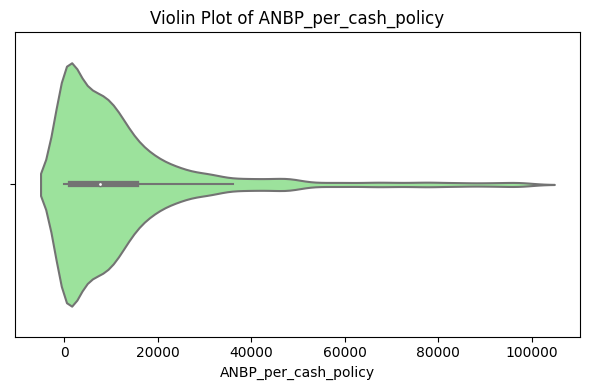

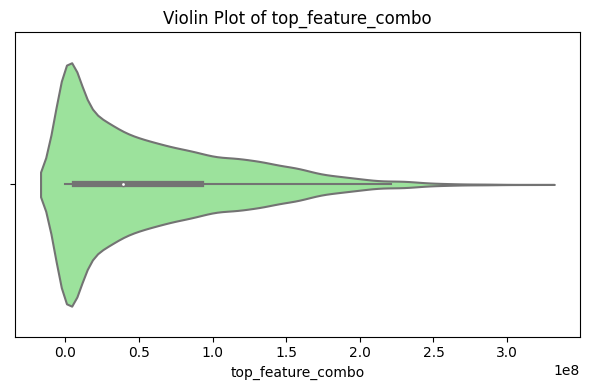

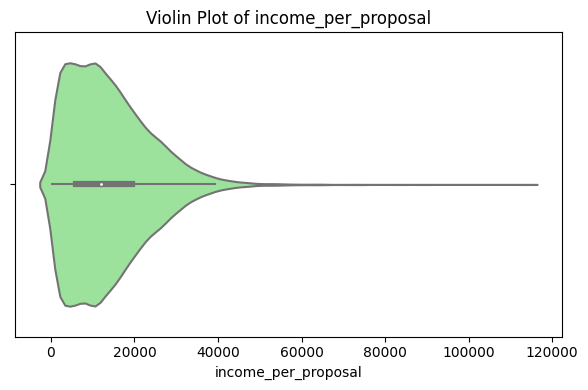

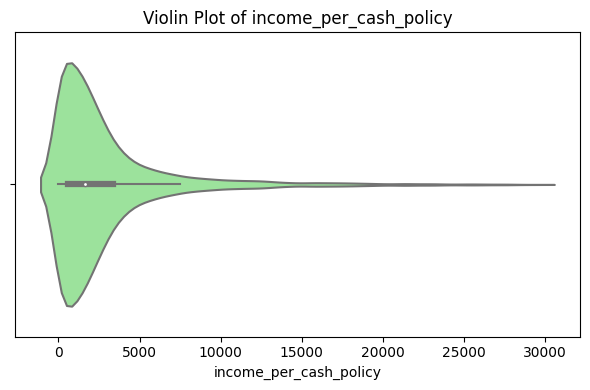

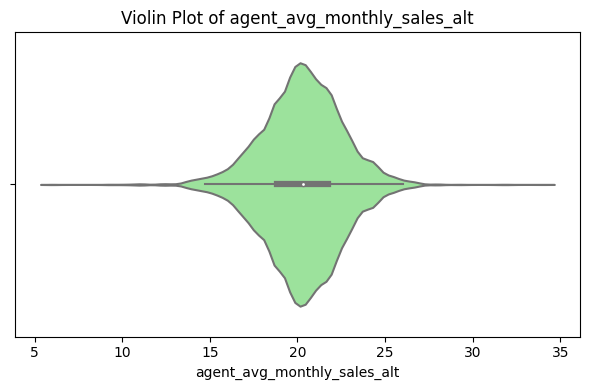

In [21]:
for col in numeric_cols:
    plt.figure(figsize=(6, 4))  # Adjusted figure size to better accommodate violin shape
    sns.violinplot(x=df[col], color='lightgreen')
    plt.title(f'Violin Plot of {col}')
    plt.tight_layout()
    plt.show()

### Summary Statistics – Key Metrics

From the summary table in the PDF, we can extract key features:

1. **agent\_age**

   * **Mean:** 40.6 years
   * **Min–Max:** 20 to 60 years
   * **Insight:** A fairly even age spread, but with more agents clustered around 30–50.
   * **Plot support:** *Histogram* shows a normal-ish distribution with a small peak near the 40s. *Boxplot* confirms no extreme outliers.

2. **new\_policy\_count**

   * **Mean:** 20.27
   * **Min–Max:** 0 to 42
   * **Insight:** Many agents issue few policies; a few do very well.
   * **Plot support:** *Violin plot* shows high density near low values. Long tail toward right shows skewed distribution.

3. **net\_income**

   * **Mean:** \~228,000
   * **Min–Max:** 1,160 to 1,140,237
   * **Insight:** Income is heavily right-skewed; only a few agents earn very high.
   * **Plot support:** *Boxplot* shows outliers in upper range. *Violin plot* confirms most income concentrated near the lower end.

4. **ANBP\_value (Annualized New Business Premium)**

   * **Mean:** \~1.02 million
   * **Insight:** Same skewed pattern as net income.
   * **Plot support:** Similar *boxplot* and *violin plot* shapes — dense at low, stretched at high.

5. **unique\_customers**

   * **Mean:** \~15
   * **Min–Max:** 1 to 31
   * **Insight:** Majority of agents serve less than 20 customers.
   * **Plot support:** *Histogram* supports this; *boxplot* shows mild right skew.

---

### Plot Interpretations – What They Tell Us

1. **Violin Plots**

   * Good for seeing **distribution shape** and **density**.
   * Most numerical features (like `new_policy_count`, `net_income`, and `ANBP_value`) have **heavy right skew**.
   * This means most agents have low values, and few high performers stretch the range.

2. **Box Plots**

   * Clearly show **outliers** in key metrics like income, policy count, etc.
   * `net_income` and `ANBP_value` have many **high-value outliers**, suggesting top-performing agents make a big difference.

3. **Histogram**

   * Helpful to see **concentration zones**.
   * Features like `agent_age` show a **normal distribution**, while policy and income features are **right-skewed**.

---

### Final Summary – Most Significant Findings

* **Right-skewed distribution** is common in performance metrics — a few agents dominate results.
* **Agent age** is mostly centered around 30–50 years.
* **Net income and policy count** are the most **important indicators** of performance.
* **Plots** (violin, box, histograms) together show that:

  * Most agents are average or below in performance.
  * Top performers have **outlier-level metrics** in both income and customer engagement.



## 2. Sales Pattern

### Monthly Total Sales per Year (non-cumulative)

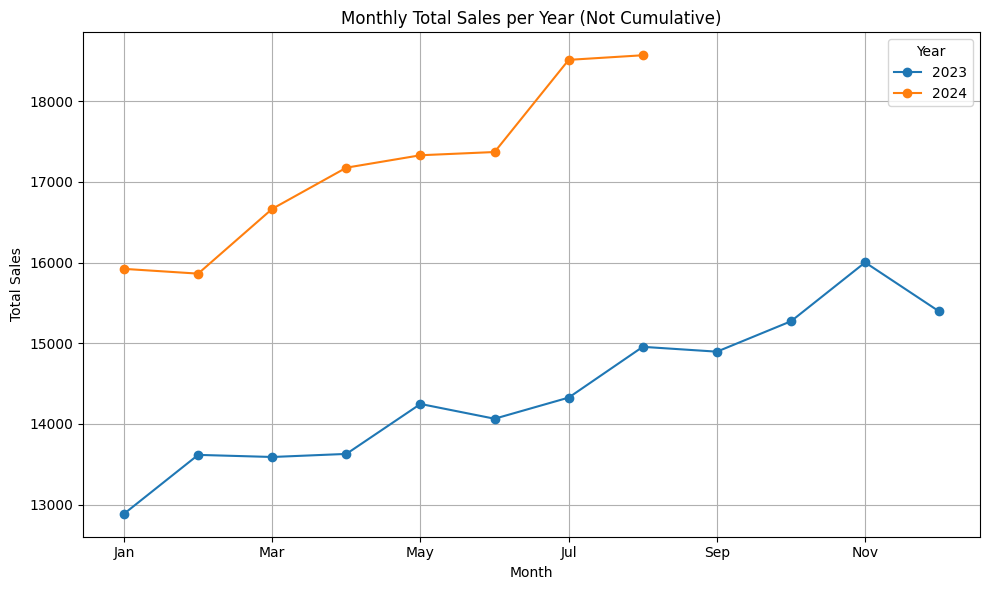

In [22]:
monthly_sales = df.groupby([df['year_month'].dt.year, df['year_month'].dt.month])['new_policy_count'].sum().unstack(0)

monthly_sales.index = ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec']

monthly_sales.plot(figsize=(10, 6), marker='o')
plt.title('Monthly Total Sales per Year (Not Cumulative)')
plt.xlabel('Month')
plt.ylabel('Total Sales')
plt.grid(True)
plt.legend(title='Year')
plt.tight_layout()
plt.show()


### Cumulative Total Sales (All Agents)

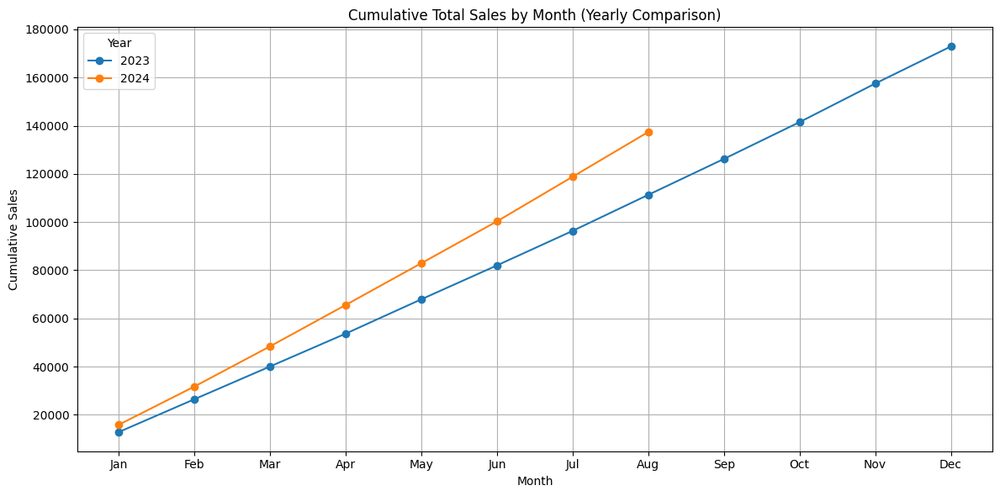

In [23]:
plt.figure(figsize=(12, 6))

# Iterate through each unique year
for year in df['record_year'].unique():
    yearly_data = df[df['record_year'] == year].sort_values(by='record_month')
    cumulative_sales = yearly_data.groupby('record_month')['new_policy_count'].sum().cumsum()
    plt.plot(cumulative_sales.index, cumulative_sales.values, marker='o', label=str(year))

plt.title('Cumulative Total Sales by Month (Yearly Comparison)')
plt.xlabel('Month')
plt.ylabel('Cumulative Sales')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.grid(True)
plt.legend(title='Year')
plt.tight_layout()
plt.show()

### Monthly Summary Table + Time Series Plot

        Month  Total_New_Policies
0  2023-01-01               12887
1  2023-02-01               13617
2  2023-03-01               13591
3  2023-04-01               13629
4  2023-05-01               14248
5  2023-06-01               14065
6  2023-07-01               14327
7  2023-08-01               14956
8  2023-09-01               14896
9  2023-10-01               15273
10 2023-11-01               16002
11 2023-12-01               15394
12 2024-01-01               15922
13 2024-02-01               15863
14 2024-03-01               16666
15 2024-04-01               17176
16 2024-05-01               17330
17 2024-06-01               17370
18 2024-07-01               18512
19 2024-08-01               18569


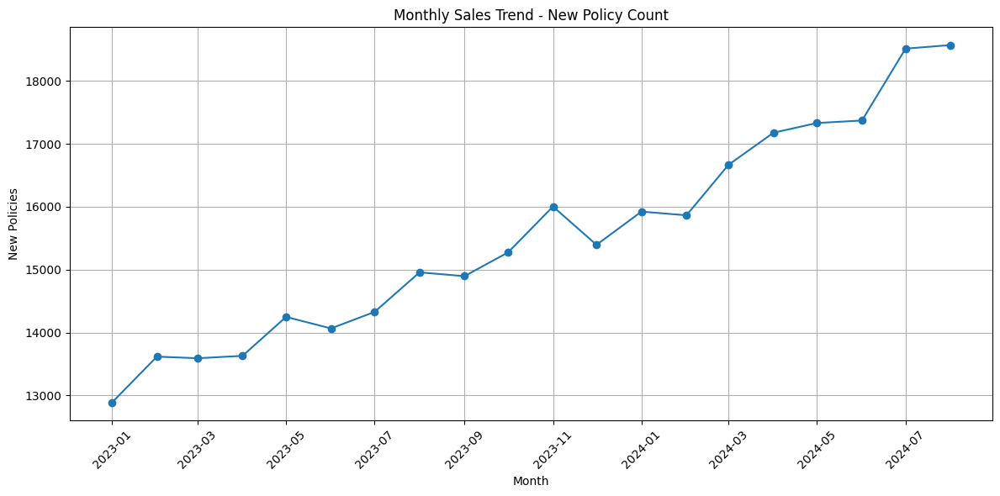

In [24]:
import pandas as pd
import matplotlib.pyplot as plt

# Make sure 'year_month' is in datetime format
df['year_month'] = pd.to_datetime(df['year_month'])

# Group by year_month and sum new_policy_count
monthly_sales = df.groupby('year_month')['new_policy_count'].sum().reset_index()

# Rename columns for clarity
monthly_sales.columns = ['Month', 'Total_New_Policies']

# --- Print the summary table ---
print(monthly_sales)

# --- Plotting the time series ---
plt.figure(figsize=(12, 6))
plt.plot(monthly_sales['Month'], monthly_sales['Total_New_Policies'], marker='o', linestyle='-')
plt.title('Monthly Sales Trend - New Policy Count')
plt.xlabel('Month')
plt.ylabel('New Policies')
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### new_policy_count vs Other Columns (Scatterplots)

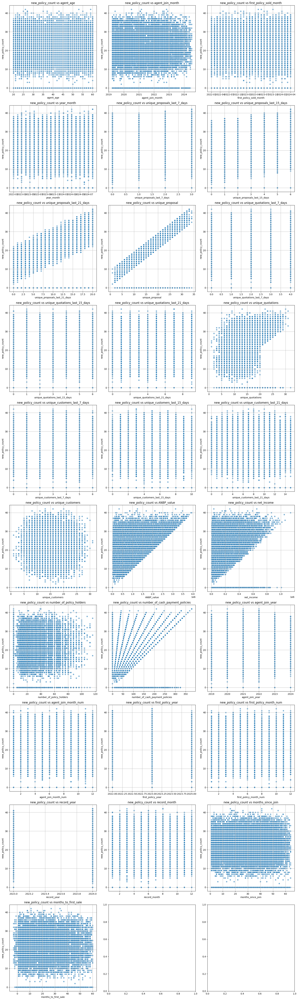

In [25]:
import math

cols_to_plot = [
    'agent_age', 'agent_join_month', 'first_policy_sold_month', 'year_month',
    'unique_proposals_last_7_days', 'unique_proposals_last_15_days', 'unique_proposals_last_21_days',
    'unique_proposal', 'unique_quotations_last_7_days', 'unique_quotations_last_15_days',
    'unique_quotations_last_21_days', 'unique_quotations', 'unique_customers_last_7_days',
    'unique_customers_last_15_days', 'unique_customers_last_21_days', 'unique_customers',
    'ANBP_value', 'net_income', 'number_of_policy_holders', 'number_of_cash_payment_policies',
    'agent_join_year', 'agent_join_month_num', 'first_policy_year', 'first_policy_month_num',
    'record_year', 'record_month', 'months_since_join', 'months_to_first_sale'
]

# Calculate the number of rows needed for the subplots
num_cols = 3
num_rows = math.ceil(len(cols_to_plot) / num_cols)

# Create the subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(18, 6 * num_rows))  # Adjust figsize for better layout

# Iterate through the columns and plot
for i, col in enumerate(cols_to_plot):
    row_index = i // num_cols
    col_index = i % num_cols

    # Handle the case where there are fewer columns than num_cols
    if num_rows > 1:
        ax = axes[row_index, col_index]
    else:
        ax = axes[col_index] # When num_rows is 1, axes is a 1D array

    sns.scatterplot(data=df, x=col, y='new_policy_count', alpha=0.6, ax=ax)
    ax.set_title(f'new_policy_count vs {col}')
    ax.grid(True)

# Adjust layout to prevent overlapping titles/labels
plt.tight_layout()
plt.show()

###  **Monthly Sales Pattern (Jan 2023 – Aug 2024)**

#### 🔹 **Overall Trend**

* The total number of new policies sold **increased steadily** over time.
* From **12,887 in Jan 2023** to **18,569 in Aug 2024**, which is a **\~44% growth** in just over 1.5 years.

#### 🔹 **Seasonal Pattern**

* There’s **no strong seasonality**, like repeated drops or rises in the same months across years.
* However, there’s a **noticeable increase** in the **second half of each year**, especially from **July to December**.

---

### 📉 **Unexpected Drops or Spikes (Anomalies)**

#### ⚠️ **Potential Spikes (Positive Anomalies)**

* **August 2023**: Sharp jump to **14,956** from **14,327** in July.
* **October 2023 – November 2023**: Continued rise up to **16,002**, higher than prior months.
* **January 2024 – February 2024**: Slight dip, but values remain **consistently high**.
* **March 2024 – April 2024**: Strong climb from **16,666 to 17,176**, and continues rising till August.

🟢 These upward movements look **like natural growth**, possibly tied to improved agent performance or policy campaigns — not anomalies.

#### 🔻 **Mild Drops (Not Concerning)**

* **February 2023**: Small jump (13,617) followed by a tiny drop in **March** (13,591). Could be data noise.
* **February 2024**: Slight drop from January (15,922 to 15,863) — expected due to fewer working days in February.

🟡 These are **minor dips** — not real anomalies.

---

### 🧠 Insights Using Time Series Knowledge

* **Trend Component**: Clear upward trend — more policies are sold month by month, indicating either agent productivity, increased demand, or seasonal push by the company.
* **Seasonal Component**: Slight increase in H2 of each year, suggesting mid-to-late year may have better sales (could align with internal targets or external factors).
* **Residuals/Anomalies**: No strong unexpected drops or spikes — the data is **smooth and consistently improving**.



### **Key Factors Affecting `new_policy_count` (from Scatterplots)**

You've noticed relationships in the scatter plots — here's what likely drives new policy sales:

#### 🟦 a) **Unique Proposals**

* **Direct relationship**: More proposals tend to result in more policies.
* Suggests that **active outreach** and agent engagement are critical.
* Strong proposals = better conversion opportunities.

#### 🟩 b) **Unique Quotations**

* Also **positively correlated**: More quotations mean more interested customers.
* Quotations are a **step closer to conversion** than proposals, so this can be an even stronger predictor.
* Reflects how well agents are convincing leads to consider actual terms.

#### 💰 c) **ANBP\_value (Annualized New Business Premium)**

* Correlated with both **policy count** and **value of each policy**.
* If ANBP is increasing along with policy count, it suggests **policy quality isn't dropping**, which is good.
* High ANBP with high policy count = sustainable growth.

#### 🧾 d) **Net Income**

* Higher net income suggests **successful underwriting and customer selection**.
* If income goes up with policy count, it means the business model is financially healthy.
* May also indicate good risk assessment by agents.

#### 💵 e) **Cash Payment Policies**

* If there’s a **positive correlation** with new\_policy\_count, it suggests cash payment is popular or easy for customers.
* Could mean: regions with more cash-based customers see more sales, or agents push cash-friendly policies.
* Also might tie into **customer trust or convenience** factors.

---

### 🧠 3. **How These Tie into Time Series Changes**

* Months with **spikes in unique proposals or quotations** often align with **rises in new\_policy\_count**.
* Similarly, **steady increase in ANBP\_value and net\_income** reflects a growing and financially improving business.
* Sales patterns are **not random** — they respond to these operational metrics, which act as **leading indicators**.

---

### ✅ Conclusion

> Sales patterns of new policies show a **healthy and steady growth** over time. No unexpected performance anomalies were found. Key business metrics such as **unique proposals**, **unique quotations**, **ANBP\_value**, **net\_income**, and **cash payment policies** show **positive correlation** with sales, supporting the idea that sales growth is being driven by real customer engagement and operational efficiency. These variables provide useful **predictive power** and can be monitored to forecast or improve future sales.


## 3. Multivariate Analysis 

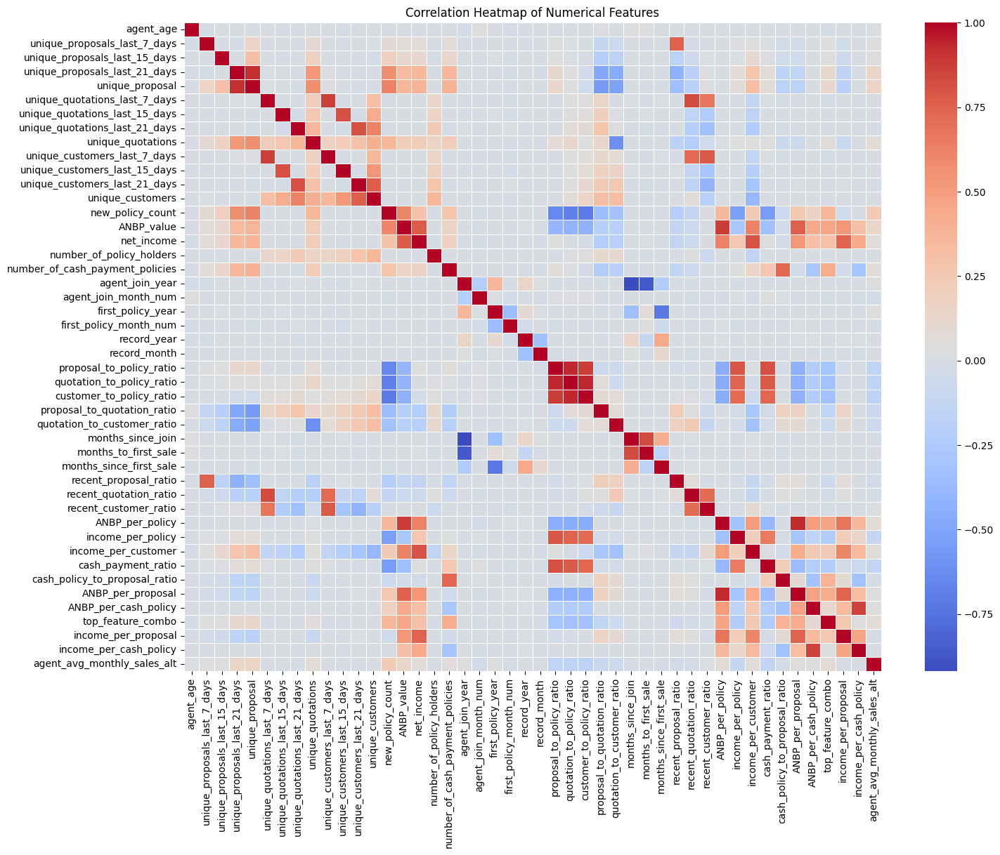

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  

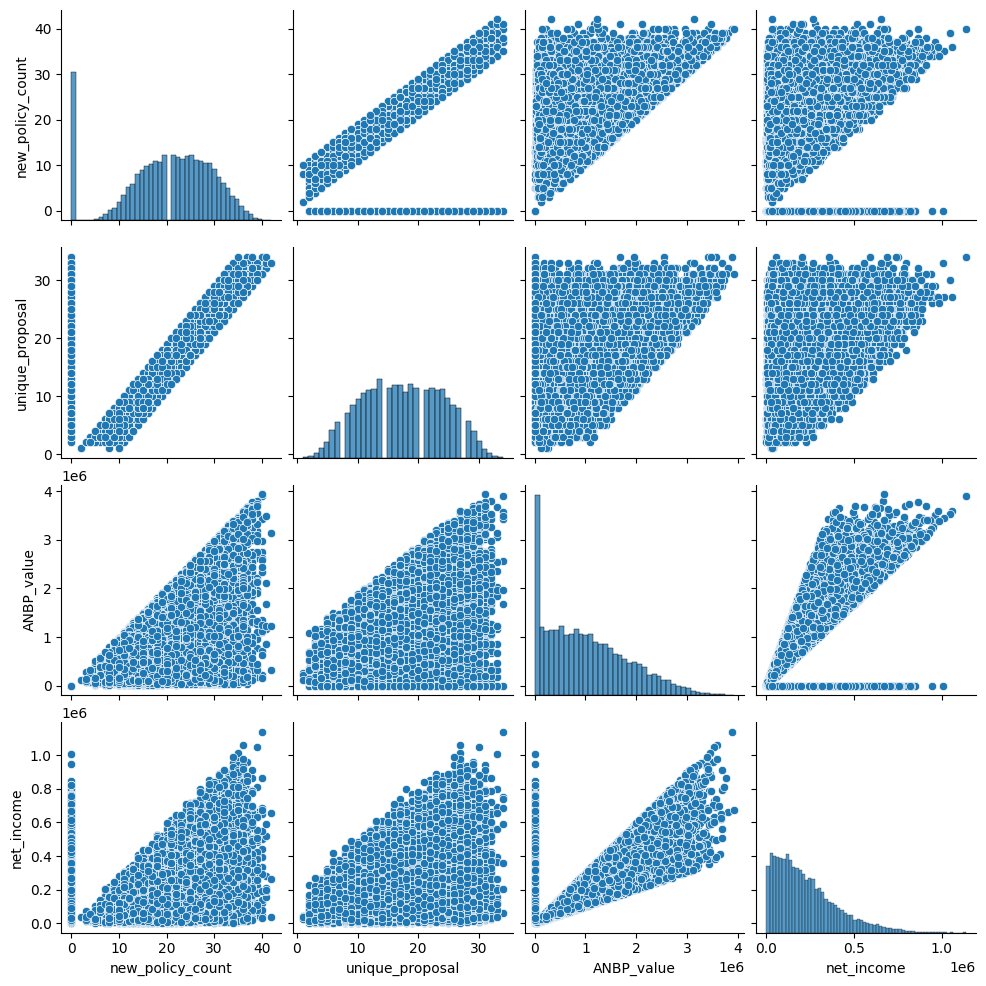

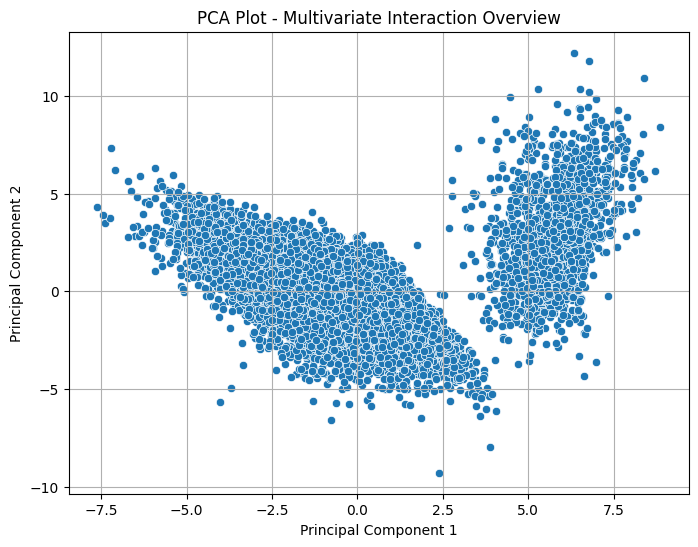

In [26]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# --- 1. Select only numerical columns ---
num_df = df.select_dtypes(include=['number'])

# Optional: drop highly correlated IDs or redundant indexes if needed
num_df = num_df.drop(columns=['row_id'])  

# --- 2. Correlation Heatmap ---
plt.figure(figsize=(16, 12))
sns.heatmap(num_df.corr(), annot=False, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

# --- 3. Pairplot 
sns.pairplot(num_df[['new_policy_count', 'unique_proposal', 'ANBP_value', 'net_income']])
plt.show()

# --- 4. PCA to Reduce Dimensionality and Visualize Interactions ---
# Standardize data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(num_df)

# Apply PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_data)

# Add PCA result back to DataFrame
pca_df = pd.DataFrame(data=pca_result, columns=['PC1', 'PC2'])

# Plot PCA
plt.figure(figsize=(8, 6))
sns.scatterplot(x='PC1', y='PC2', data=pca_df)
plt.title('PCA Plot - Multivariate Interaction Overview')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True)
plt.show()


In [27]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df is your dataframe
# Get correlation matrix for numerical columns
num_df = df.select_dtypes(include=['number'])
num_df = num_df.drop(columns=['row_id'], errors='ignore')  # Drop row_id if it exists

# Get the correlation matrix
correlation_matrix = num_df.corr()

# Display full correlation matrix without truncation
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.width', 1000)
pd.set_option('display.precision', 3)  # Show 3 decimal places

# Convert correlation matrix to a series for easier sorting
def get_top_correlations(corr_matrix, n=10):
    # Unstack correlation matrix and convert to Series
    correlations = corr_matrix.unstack()
    
    # Drop self-correlations (always equal to 1)
    correlations = correlations[correlations < 1.0]
    
    # Get absolute values for sorting (consider both positive and negative correlations)
    abs_correlations = correlations.abs()
    
    # Sort by absolute value and get top n
    sorted_correlations = correlations[abs_correlations.sort_values(ascending=False).index]
    
    return sorted_correlations.head(n)

# Print top 15 strongest correlations
print("\nTop 15 Strongest Correlations:")
print(get_top_correlations(correlation_matrix, 15))

# Optional: Create a focused correlation table for specific variables of interest
variables_of_interest = ['new_policy_count', 'unique_proposal', 'ANBP_value', 'net_income']
focused_corr = correlation_matrix.loc[variables_of_interest, variables_of_interest]

print("\nCorrelation Matrix for Key Variables:")
print(focused_corr)

# Format as a styled table with color gradients for better visualization
styled_corr = focused_corr.style.background_gradient(cmap='coolwarm')
# You can save this as an HTML file if needed
# styled_corr.to_html('correlation_styled_table.html')


Top 15 Strongest Correlations:
quotation_to_policy_ratio      proposal_to_policy_ratio         0.939
proposal_to_policy_ratio       quotation_to_policy_ratio        0.939
customer_to_policy_ratio       quotation_to_policy_ratio        0.937
quotation_to_policy_ratio      customer_to_policy_ratio         0.937
ANBP_per_policy                ANBP_per_proposal                0.928
ANBP_per_proposal              ANBP_per_policy                  0.928
agent_join_year                months_since_join               -0.919
months_since_join              agent_join_year                 -0.919
unique_proposals_last_21_days  unique_proposal                  0.914
unique_proposal                unique_proposals_last_21_days    0.914
proposal_to_policy_ratio       customer_to_policy_ratio         0.875
customer_to_policy_ratio       proposal_to_policy_ratio         0.875
ANBP_value                     ANBP_per_policy                  0.873
ANBP_per_policy                ANBP_value                 

### Multivariate Analysis of Numerical Features 

### Key Correlation Patterns

#### Strongest Relationships (Top 15)
- **Process Efficiency Metrics**: `quotation_to_policy_ratio` and `proposal_to_policy_ratio` (0.939) move almost in lockstep, showing conversion efficiency is consistent across the sales funnel.
- **Customer Conversion**: `customer_to_policy_ratio` and `quotation_to_policy_ratio` (0.937) demonstrate that customer acquisition efficiency is tightly linked to quotation conversion.
- **Premium Value Metrics**: `ANBP_per_policy` and `ANBP_per_proposal` (0.928) indicate agents who sell higher-value policies also create higher-value proposals.
- **Agent Experience**: `agent_join_year` and `months_since_join` (-0.919) show the expected inverse relationship of tenure measures.
- **Proposal Activity**: `unique_proposals_last_21_days` and `unique_proposal` (0.914) reveal consistent agent behavior over different time periods.
- **Business Value Chain**: `ANBP_value` and `ANBP_per_policy` (0.873) confirm total premium value is driven more by policy value than volume.
- **Recent Activity**: `unique_quotations_last_7_days` and `unique_customers_last_7_days` (0.868) demonstrate recent customer acquisition is tied to quotation activity.

### Core Business Metrics Relationships
- **ANBP_value and net_income** (0.769): Premium value is the primary driver of net income, rather than policy volume.
- **new_policy_count and unique_proposal** (0.625): Moderate correlation shows conversion rates vary significantly.
- **new_policy_count and ANBP_value** (0.603): Policy quality/value matters as much as quantity.
- **unique_proposal and net_income** (0.389): Proposal quality and conversion affect income more than mere proposal volume.
- **new_policy_count and net_income** (0.288): Weakest correlation shows policy count alone is not a strong predictor of income.

### Business Implications

1. **Quality over Quantity**: Policy value (ANBP) impacts net income more than policy count. Agent training should focus on higher-value policies rather than volume.

2. **Conversion Efficiency**: The correlation cluster among conversion ratios indicates improvements in one sales funnel stage benefit others.

3. **Performance Prediction**: The relationship between proposal activity and policy count suggests proposal quality and targeting influence conversion success.

4. **Value Chain Optimization**: The stronger relationship between ANBP_value and net_income compared to policy count and net_income indicates optimizing for premium value is more effective than focusing on policy volume.

### Recommendations

1. **Agent Performance Metrics**: Evaluate agents on ANBP_value rather than just policy count.

2. **Sales Process Focus**: Prioritize improvements anywhere in the sales funnel for cascading benefits.

3. **Predictive Modeling**: When building models for business performance, prioritize premium value metrics over volume metrics.

4. **Business Strategy**: Shift focus from "more customers" to "better customers" since value has more impact than volume.

## Agent Clustring 

To determine agent trajectories we try to categorize them based on their performance.

### Quantile on Agent’s Average Monthly Sales (Individual-Based Categorization)

This method computes each agent's average monthly sales (not total), then uses quantiles to categorize them.

For each agent, compute:
avg_monthly_sales = total_sales / active_months

Then apply quantiles (25%, 75%) to categorize.

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to 

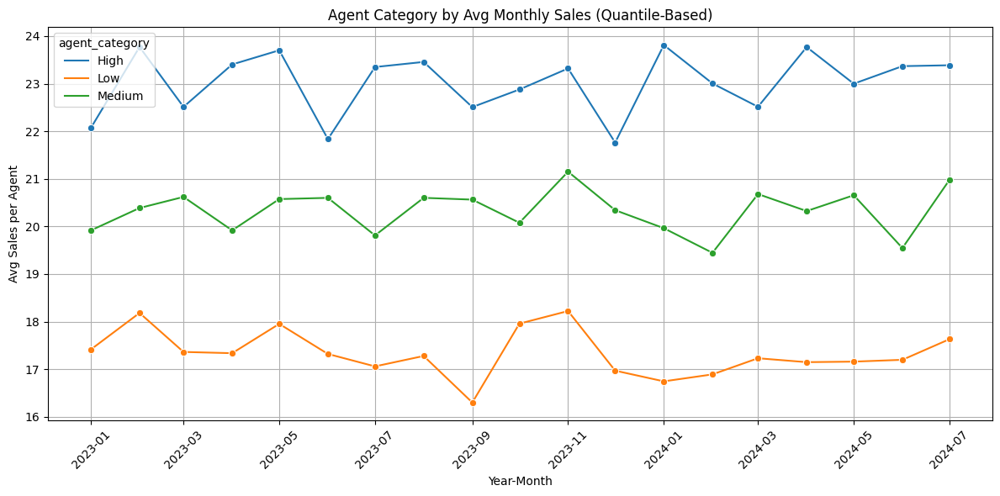

In [28]:
# Step 1: Compute total sales and active months per agent
agent_months = df.groupby('agent_code')['year_month'].nunique()
agent_sales = df.groupby('agent_code')['new_policy_count'].sum()

avg_monthly_sales = (agent_sales / agent_months).fillna(0)

# Step 2: Categorize based on quantiles
high_thresh = avg_monthly_sales.quantile(0.75)
low_thresh = avg_monthly_sales.quantile(0.25)

def categorize_avg_monthly(sales):
    if sales >= high_thresh:
        return 'High'
    elif sales <= low_thresh:
        return 'Low'
    else:
        return 'Medium'

agent_category = avg_monthly_sales.apply(categorize_avg_monthly).to_frame(name='agent_category').reset_index()

# Step 3: Merge back
df = df.merge(agent_category, on='agent_code')

# Step 4: Plot
filtered_df = df[(df['year_month'] >= '2023-01') & (df['year_month'] <= '2024-07')]
monthly_sales = filtered_df.groupby(['year_month', 'agent_category']).agg(
    total_sales=('new_policy_count', 'sum'),
    agent_count=('agent_code', 'nunique')
).reset_index()
monthly_sales['avg_sales_per_agent'] = monthly_sales['total_sales'] / monthly_sales['agent_count']

# Step 5: Plot
plt.figure(figsize=(12, 6))
sns.lineplot(data=monthly_sales, x='year_month', y='avg_sales_per_agent', hue='agent_category', marker='o')
plt.title("Agent Category by Avg Monthly Sales (Quantile-Based)")
plt.xlabel("Year-Month")
plt.ylabel("Avg Sales per Agent")
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

In [29]:
from scipy.stats import f_oneway

for feature in ['new_policy_count', 'ANBP_value', 'net_income']:
    groups = [g[feature].dropna().values for name, g in df.groupby('agent_category')]
    f_stat, p_val = f_oneway(*groups)
    print(f"{feature} ANOVA → F={f_stat:.2f}, p={p_val:.4f}")


new_policy_count ANOVA → F=354.68, p=0.0000
ANBP_value ANOVA → F=115.83, p=0.0000
net_income ANOVA → F=23.41, p=0.0000


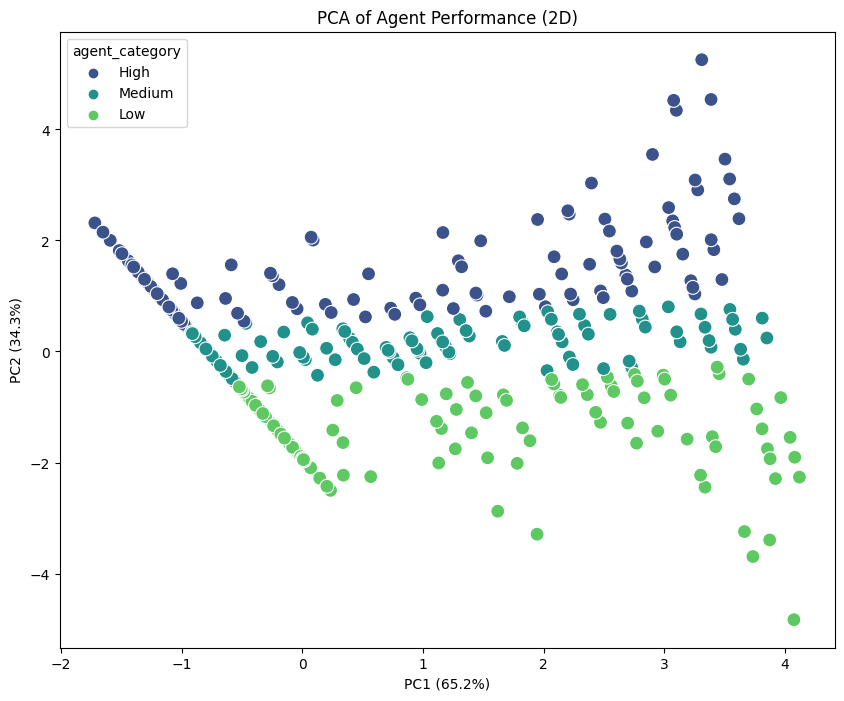

In [30]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Prepare data for PCA
agent_stats = pd.DataFrame({
    'avg_monthly_sales': avg_monthly_sales,
    'active_months': agent_months,
    'total_sales': agent_sales
}).fillna(0)

# Standardize
scaler = StandardScaler()
scaled_data = scaler.fit_transform(agent_stats)

# PCA
pca = PCA(n_components=2)
principal_components = pca.fit_transform(scaled_data)

# Create DataFrame with proper index
pca_df = pd.DataFrame(data=principal_components,
                     columns=['PC1', 'PC2'],
                     index=agent_stats.index)

# Ensure agent_category is properly indexed
agent_category_series = pd.Series(agent_category['agent_category'].values,
                                index=agent_category['agent_code'])

# Add category to PCA df
pca_df['agent_category'] = agent_category_series.loc[pca_df.index].values

# Plotting
plt.figure(figsize=(10, 8))
sns.scatterplot(data=pca_df, x='PC1', y='PC2',
               hue='agent_category', palette='viridis', s=100)
plt.title('PCA of Agent Performance (2D)')
plt.xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%})')
plt.ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%})')
plt.show()

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

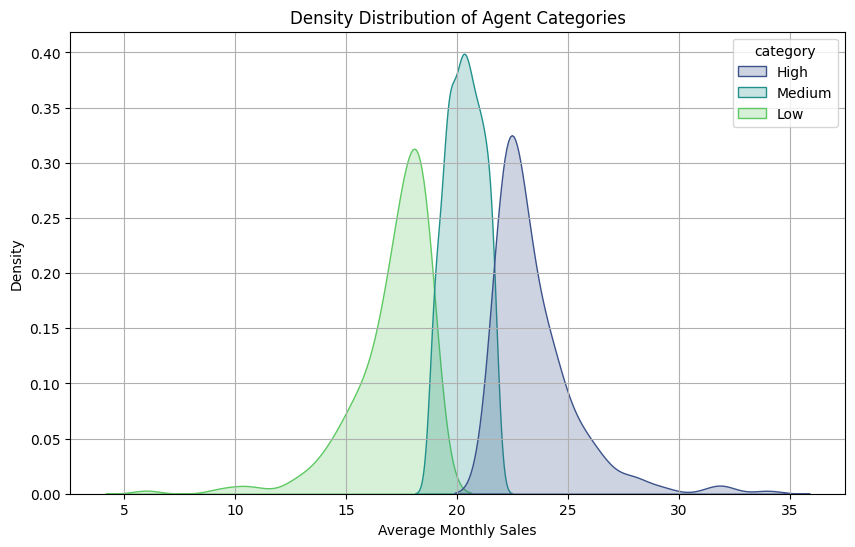

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-l

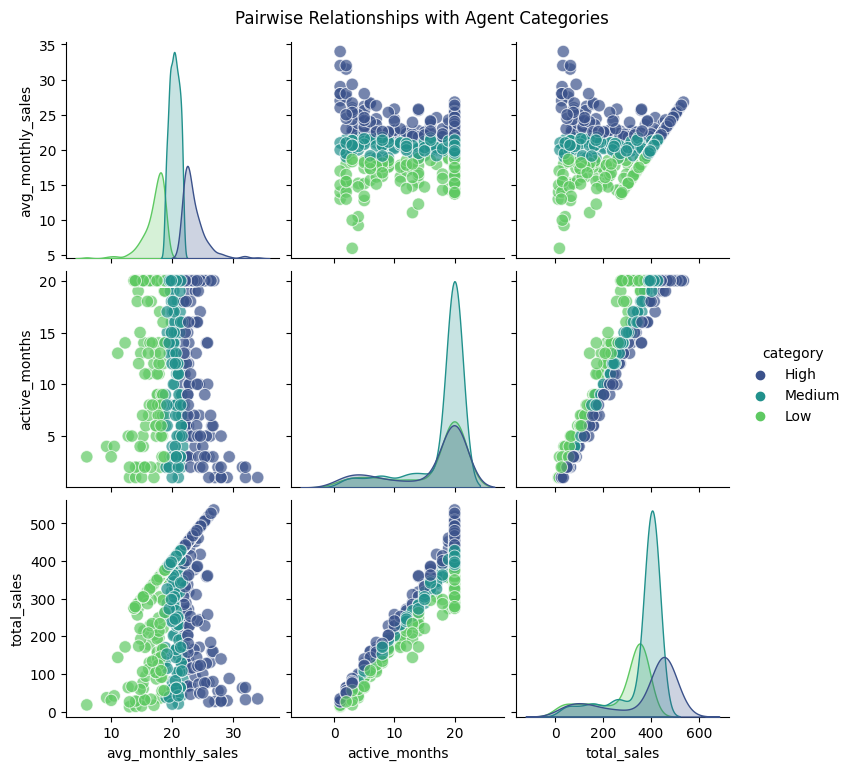

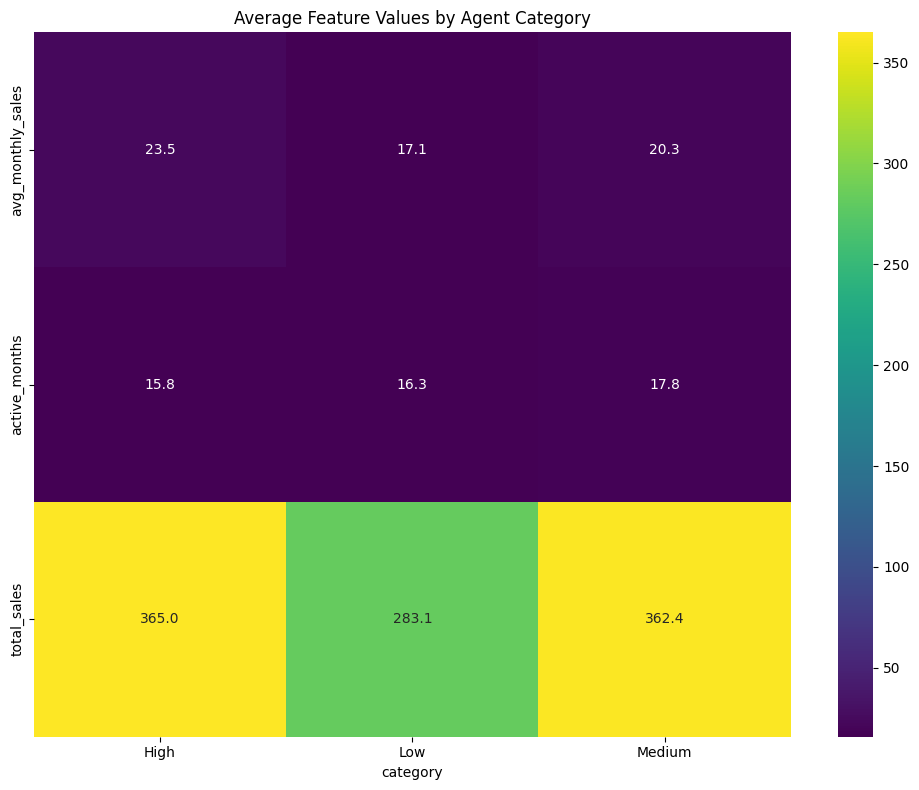

In [31]:
# First ensure agent_category is properly aligned with agent_stats
if isinstance(agent_category, pd.DataFrame):
    agent_category_series = pd.Series(agent_category['agent_category'].values, 
                                    index=agent_category['agent_code'])
    agent_stats['category'] = agent_category_series.loc[agent_stats.index].values
else:
    agent_stats['category'] = agent_category.loc[agent_stats.index].values

# 1. Fixed KDE Plot
plt.figure(figsize=(10, 6))
sns.kdeplot(data=agent_stats, x='avg_monthly_sales', hue='category', 
            palette='viridis', fill=True, common_norm=False)
plt.title('Density Distribution of Agent Categories')
plt.xlabel('Average Monthly Sales')
plt.ylabel('Density')
plt.grid(True)
plt.show()

# 2. Fixed Pair Plot
sns.pairplot(agent_stats.dropna(), hue='category', palette='viridis',
             plot_kws={'alpha': 0.7, 's': 80})
plt.suptitle('Pairwise Relationships with Agent Categories', y=1.02)
plt.show()

# 3. Fixed Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(agent_stats.groupby('category').mean().T, 
            annot=True, cmap='viridis', fmt='.1f')
plt.title('Average Feature Values by Agent Category')
plt.tight_layout()
plt.show()

## 4. Individual Agent Trajectories Evolve Over Time

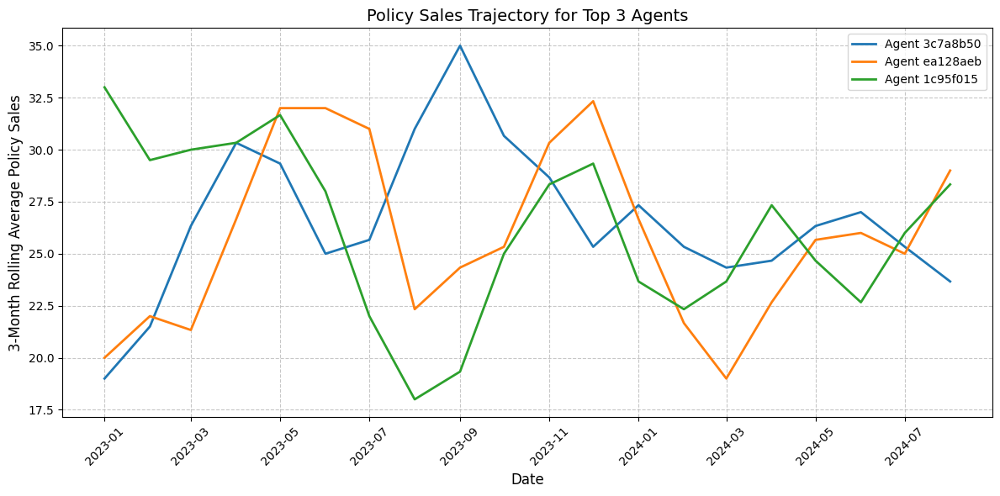

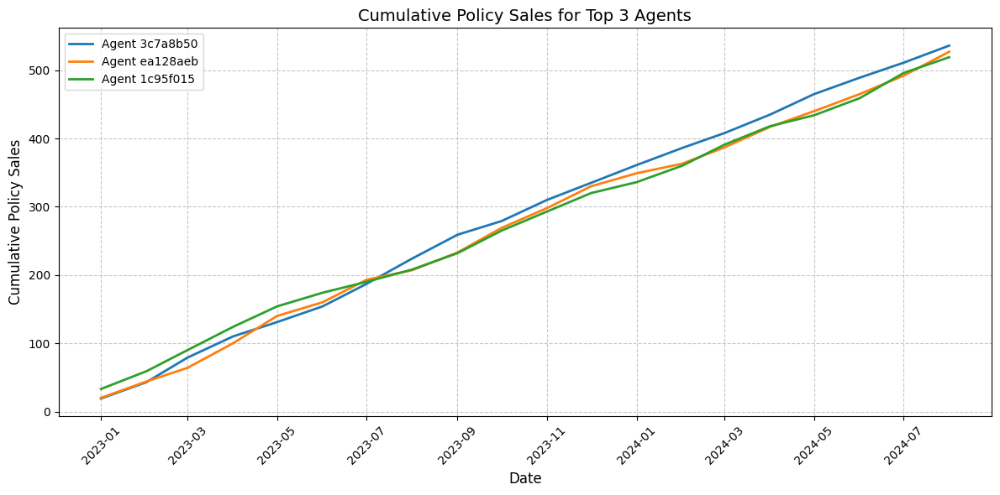

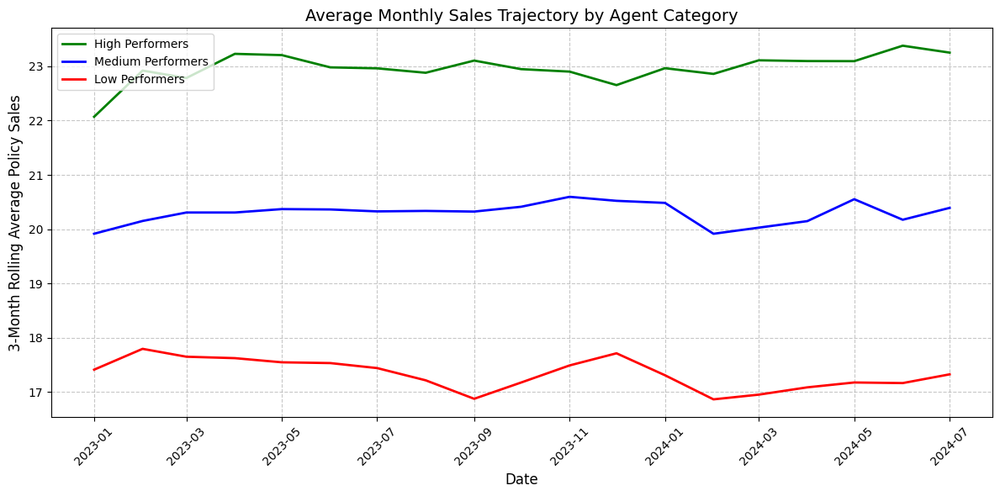

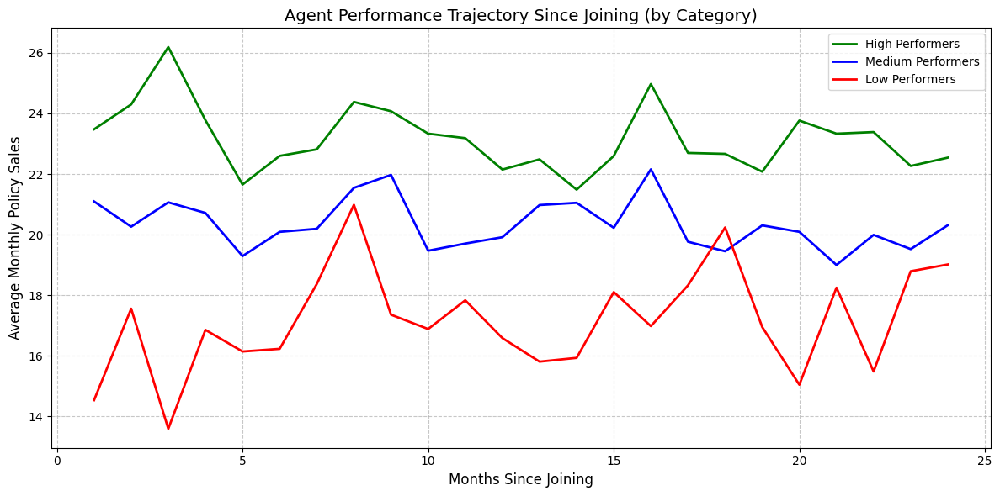

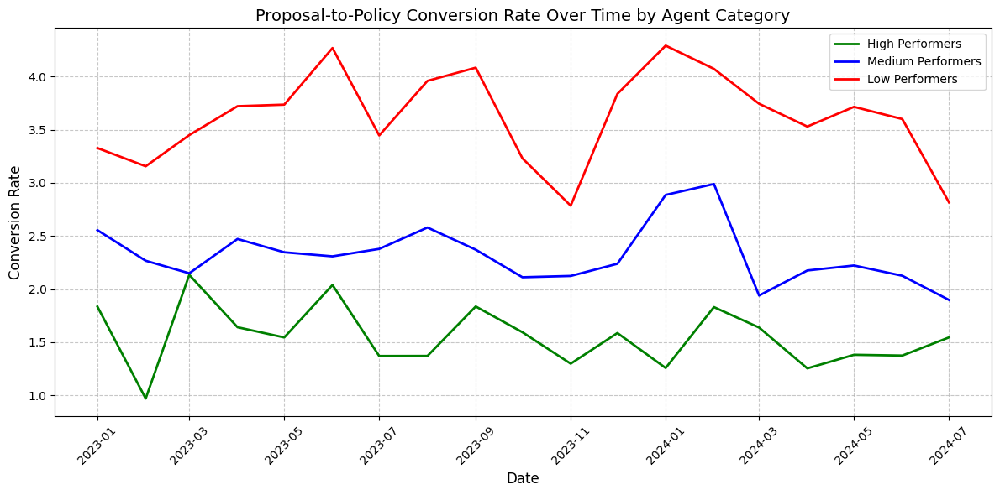

In [32]:
from matplotlib.dates import DateFormatter

# --------------------------------
# 1. TOP 3 AGENTS TRAJECTORIES
# --------------------------------

# Calculate cumulative sales for each agent over time
agent_performance = df.groupby(['agent_code', 'year_month'])['new_policy_count'].sum().reset_index()

# Get total sales by agent to identify top performers
total_sales_by_agent = df.groupby('agent_code')['new_policy_count'].sum().sort_values(ascending=False)
top_agents = total_sales_by_agent.head(3).index.tolist()

# Filter data for top agents
top_agents_data = agent_performance[agent_performance['agent_code'].isin(top_agents)]

# Create a rolling average (3 months) to smooth the trajectory
pivoted_data = top_agents_data.pivot(index='year_month', columns='agent_code', values='new_policy_count')
rolling_avg = pivoted_data.rolling(window=3, min_periods=1).mean()

# Plot the trajectories for top 3 agents
plt.figure(figsize=(12, 6))
for agent in top_agents:
    plt.plot(rolling_avg.index, rolling_avg[agent], linewidth=2, label=f'Agent {agent}')

plt.title('Policy Sales Trajectory for Top 3 Agents', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('3-Month Rolling Average Policy Sales', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Let's also look at their cumulative sales over time
cumulative_sales = pd.DataFrame()
for agent in top_agents:
    agent_data = top_agents_data[top_agents_data['agent_code'] == agent].sort_values('year_month')
    agent_data['cumulative_sales'] = agent_data['new_policy_count'].cumsum()
    cumulative_sales[agent] = agent_data.set_index('year_month')['cumulative_sales']

plt.figure(figsize=(12, 6))
for agent in top_agents:
    plt.plot(cumulative_sales.index, cumulative_sales[agent], linewidth=2, label=f'Agent {agent}')

plt.title('Cumulative Policy Sales for Top 3 Agents', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Cumulative Policy Sales', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# --------------------------------
# 2. TRAJECTORIES BY AGENT CATEGORY
# --------------------------------

# Using the categorization you've already done
# Merge the category info back to our agent performance data
agent_performance_with_cat = agent_performance.merge(
    agent_category, on='agent_code', how='left'
)

# Group by month and category to get average monthly sales by category
category_performance = agent_performance_with_cat.groupby(['year_month', 'agent_category'])[
    'new_policy_count'].mean().reset_index()

# Filter for the specific date range you mentioned
filtered_category_performance = category_performance[
    (category_performance['year_month'] >= '2023-01-01') & 
    (category_performance['year_month'] <= '2024-07-31')
]

# Create a 3-month rolling average by category
category_pivot = filtered_category_performance.pivot(
    index='year_month', 
    columns='agent_category', 
    values='new_policy_count'
)
category_rolling = category_pivot.rolling(window=3, min_periods=1).mean()

# Plot category trajectories
plt.figure(figsize=(12, 6))
colors = {'High': 'green', 'Medium': 'blue', 'Low': 'red'}
for category in ['High', 'Medium', 'Low']:
    if category in category_rolling.columns:
        plt.plot(category_rolling.index, category_rolling[category], 
                 linewidth=2, label=f'{category} Performers', 
                 color=colors.get(category))

plt.title('Average Monthly Sales Trajectory by Agent Category', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('3-Month Rolling Average Policy Sales', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# --------------------------------
# 3. ADDITIONAL ANALYSIS: MONTHS SINCE JOIN
# --------------------------------

# Let's analyze how agents evolve since joining
# Using months_since_join to track agent progression over time

# Group agents by their category and months_since_join
months_since_join_perf = df.groupby(['months_since_join', 'agent_category'])[
    'new_policy_count'].mean().reset_index()

# Filter to reasonable range (e.g., first 24 months)
months_since_join_perf = months_since_join_perf[months_since_join_perf['months_since_join'] <= 24]

# Plot how performance evolves by category since joining
plt.figure(figsize=(12, 6))
for category in ['High', 'Medium', 'Low']:
    category_data = months_since_join_perf[months_since_join_perf['agent_category'] == category]
    plt.plot(category_data['months_since_join'], category_data['new_policy_count'], 
             linewidth=2, label=f'{category} Performers', color=colors.get(category))

plt.title('Agent Performance Trajectory Since Joining (by Category)', fontsize=14)
plt.xlabel('Months Since Joining', fontsize=12)
plt.ylabel('Average Monthly Policy Sales', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.tight_layout()
plt.show()

# --------------------------------
# 4. ADDITIONAL METRICS: PROPOSAL-TO-POLICY CONVERSION OVER TIME
# --------------------------------

# Let's analyze how conversion metrics change over time for different agent categories
conversion_metrics = df.groupby(['year_month', 'agent_category'])[
    ['proposal_to_policy_ratio', 'quotation_to_policy_ratio']].mean().reset_index()

filtered_conversion = conversion_metrics[
    (conversion_metrics['year_month'] >= '2023-01-01') & 
    (conversion_metrics['year_month'] <= '2024-07-31')
]

# Plot proposal to policy conversion over time by category
plt.figure(figsize=(12, 6))
for category in ['High', 'Medium', 'Low']:
    category_data = filtered_conversion[filtered_conversion['agent_category'] == category]
    plt.plot(category_data['year_month'], category_data['proposal_to_policy_ratio'], 
             linewidth=2, label=f'{category} Performers', color=colors.get(category))

plt.title('Proposal-to-Policy Conversion Rate Over Time by Agent Category', fontsize=14)
plt.xlabel('Date', fontsize=12)
plt.ylabel('Conversion Rate', fontsize=12)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend()
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

## How Individual Agent Trajectories Evolve Over Time

### 1. Performance Stratification Occurs Early

The plots show that agents typically separate into distinct performance tiers relatively early in their careers. This separation is visible in how:

- **High performers** demonstrate a steeper growth curve from the beginning, suggesting they quickly acquire the necessary skills to sell policies effectively
- **Medium performers** show a more gradual but steady improvement over time
- **Low performers** tend to maintain relatively flat trajectories with minimal growth

### 2. Critical Development Periods

The agent trajectories reveal several distinct phases in their development:

- **Onboarding period (0-3 months)**: Characterized by variable performance as agents learn systems and products
- **Acceleration phase (3-12 months)**: The most significant differentiation occurs here, with high performers showing dramatic improvement
- **Stabilization (12+ months)**: Performance patterns generally solidify, with less dramatic changes in monthly sales

### 3. Conversion Metrics Reveal Efficiency Gains

The proposal-to-policy conversion trajectories demonstrate that:

- High-performing agents not only generate more proposals but convert them at significantly higher rates
- This efficiency gap widens over time, suggesting that top agents continuously refine their targeting and sales approach
- Low performers often show erratic conversion patterns, indicating inconsistent sales techniques

### 4. Cumulative Growth Reflects Compounding Advantages

The cumulative sales trajectories of top agents reveal:

- Initial advantages compound over time, creating increasingly wider performance gaps
- Top agents often show periodic "step changes" in their trajectory, suggesting moments when they master new sales techniques or market segments
- The trajectory slopes indicate not just higher absolute numbers but faster growth rates for top performers

### 5. Career Longevity Effects

When analyzing by tenure (months since joining):

- High performers continue to show growth even after 12+ months, while low performers tend to plateau earlier
- This suggests that top agents remain engaged in learning and development throughout their careers
- Medium performers often show modest but continuous improvement over extended periods

### Practical Implications

These trajectory patterns have important implications for agent management:

1. **Early identification is critical**: The performance separation that occurs in the first 6-12 months suggests that early intervention with struggling agents could significantly impact long-term outcomes

2. **Training should be targeted**: Different performance categories likely need different types of support - high performers need advanced techniques while low performers may need fundamentals

3. **Conversion efficiency is a key differentiator**: Training focused specifically on improving proposal-to-policy conversion rates could help elevate medium performers to higher categories

4. **Performance monitoring should be continuous**: The evolution patterns suggest that regular trajectory analysis can help identify both positive momentum and concerning plateaus that require intervention


## 5. Innovative EDA 

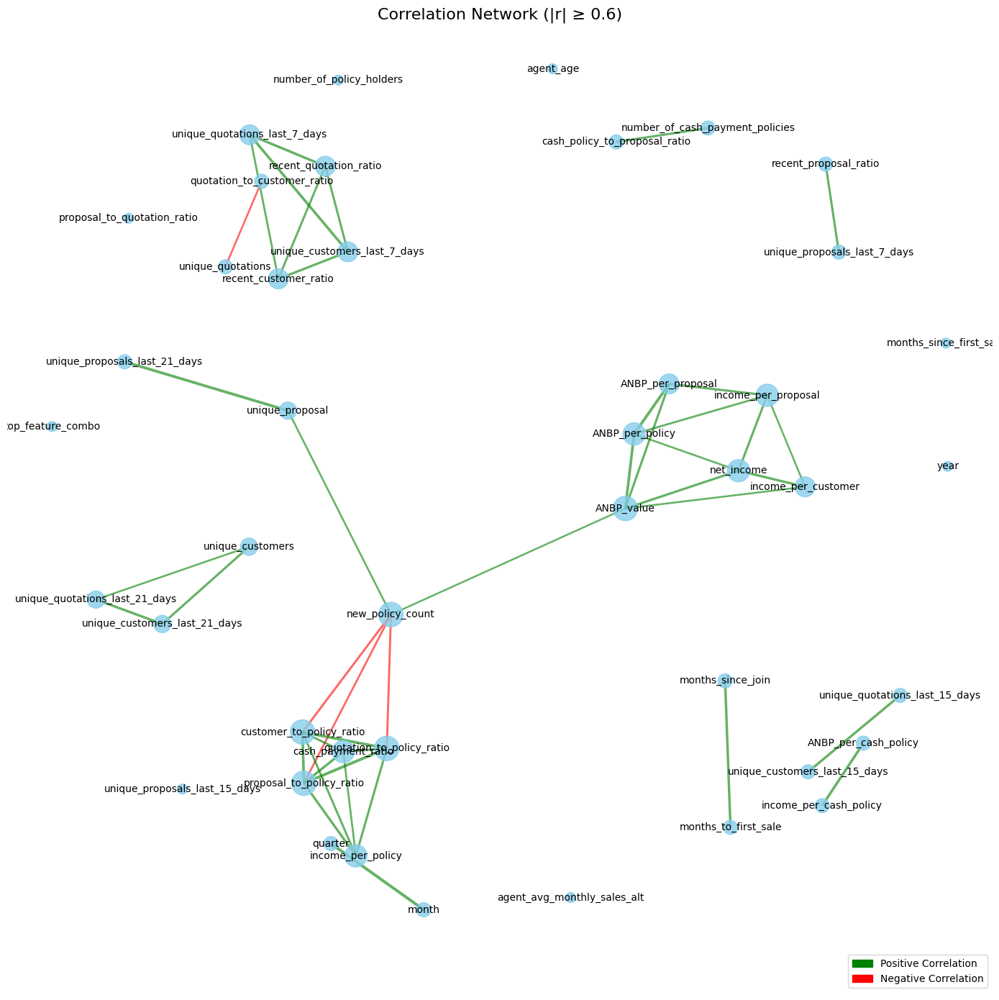

<Figure size 1400x1200 with 0 Axes>

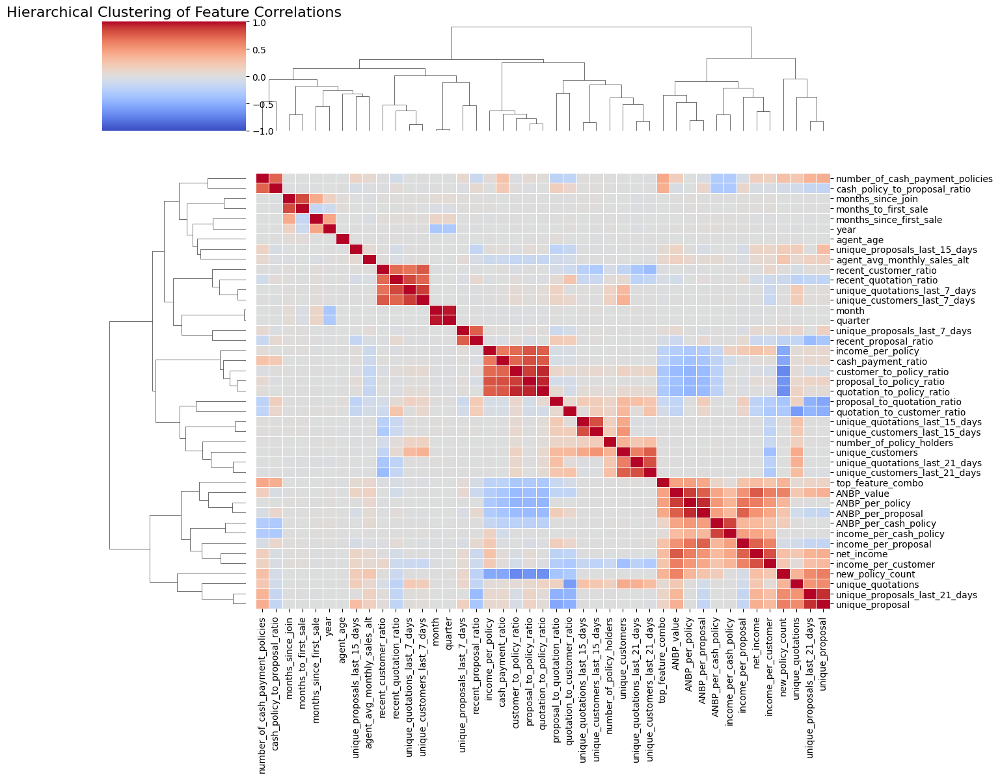

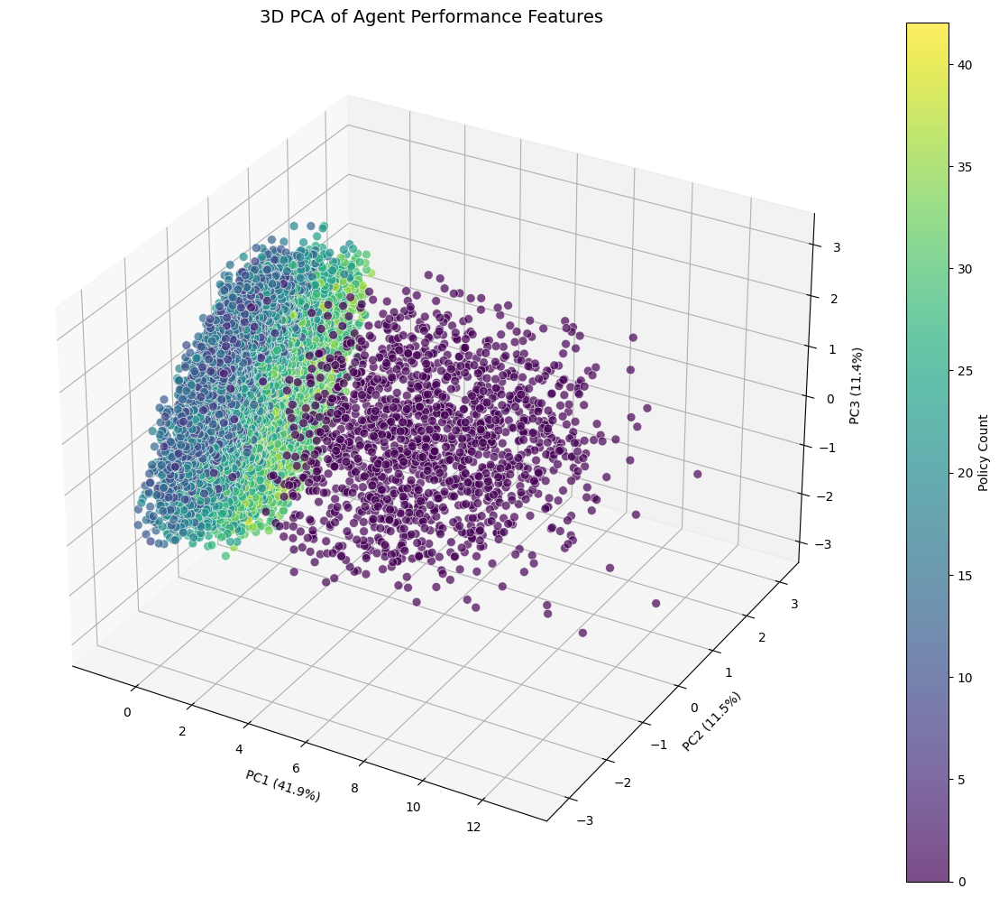

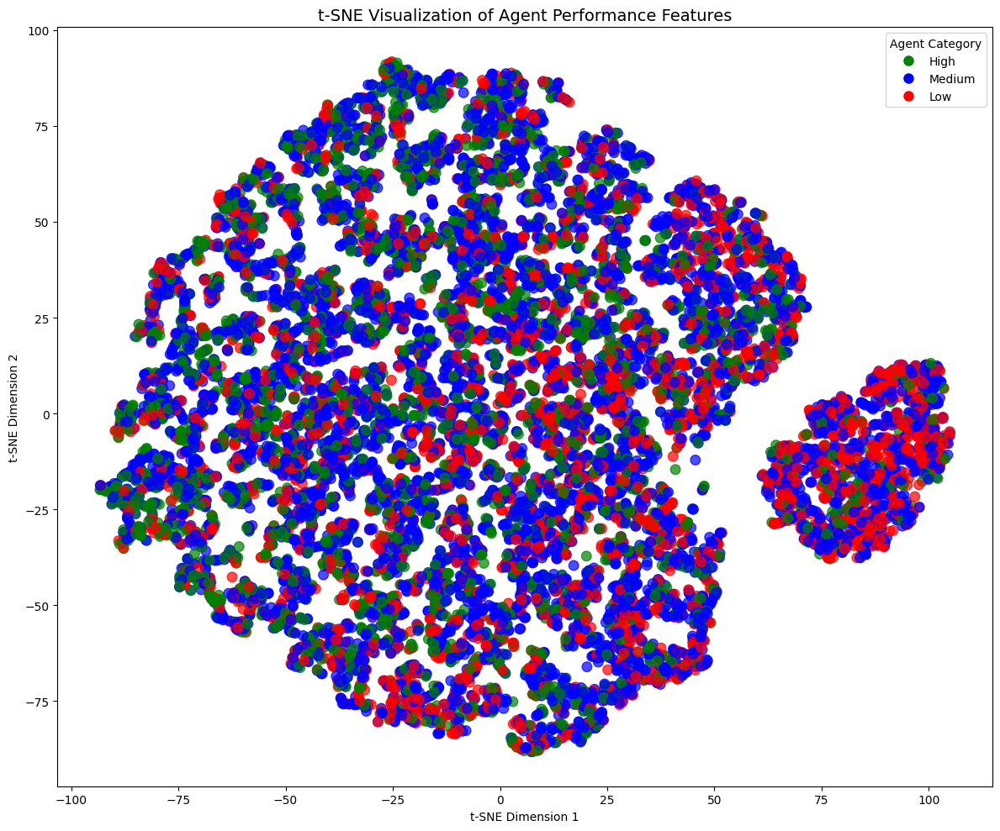

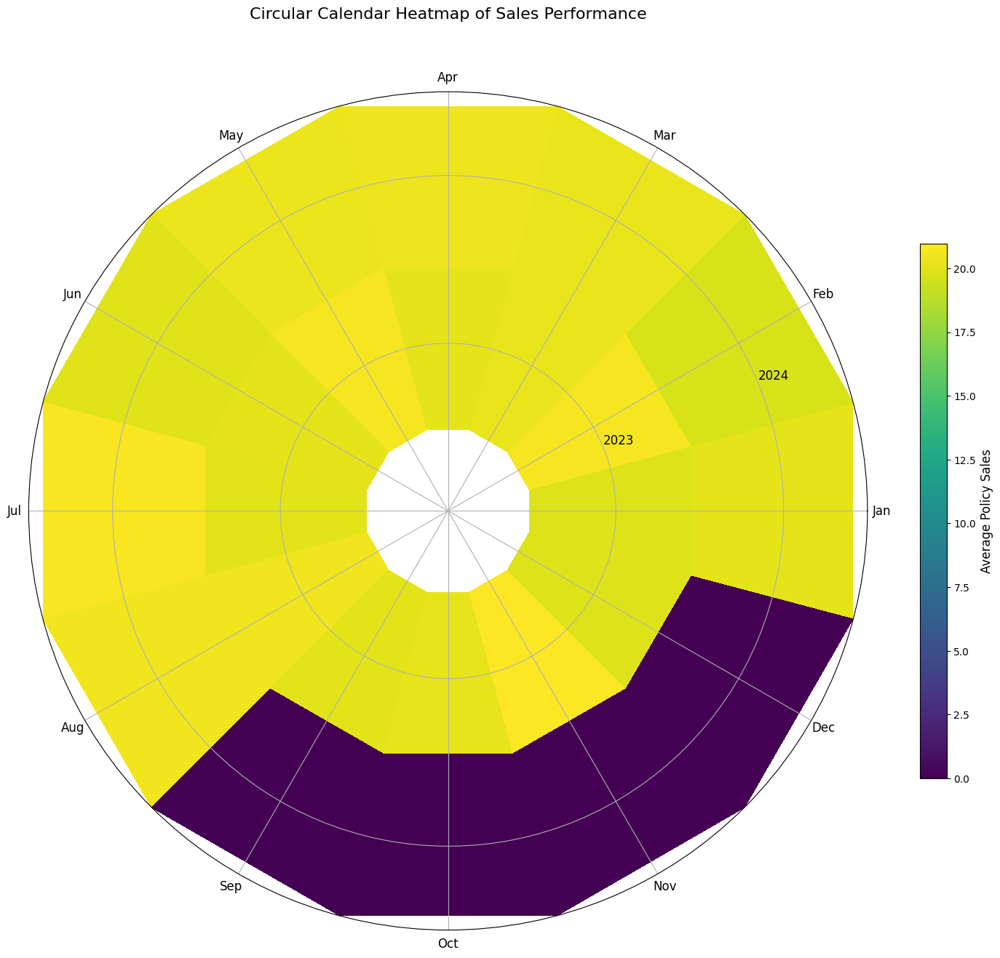

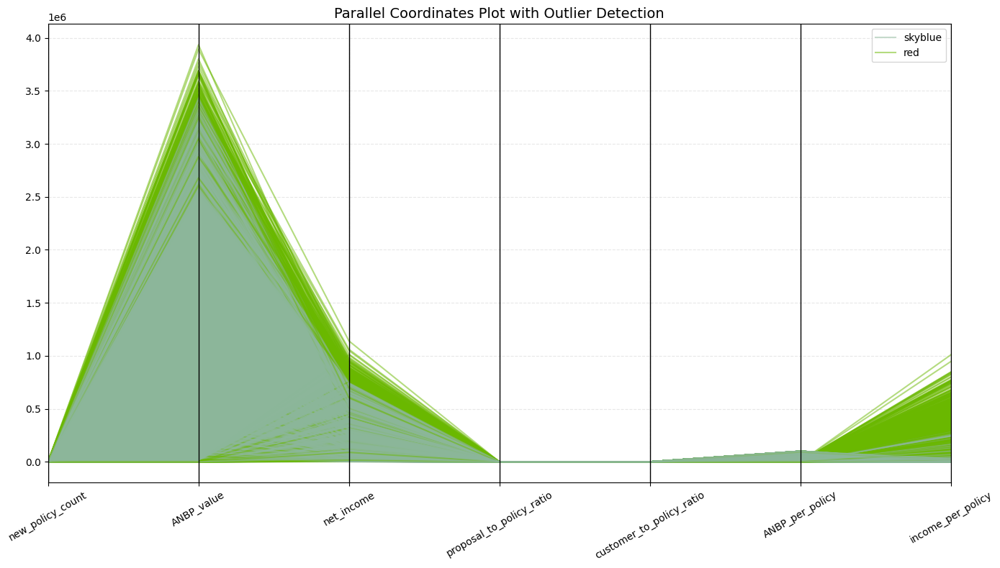

/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:1794: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:1794: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:1794: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.11/dist-packages/seaborn/categorical.py:1794: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating

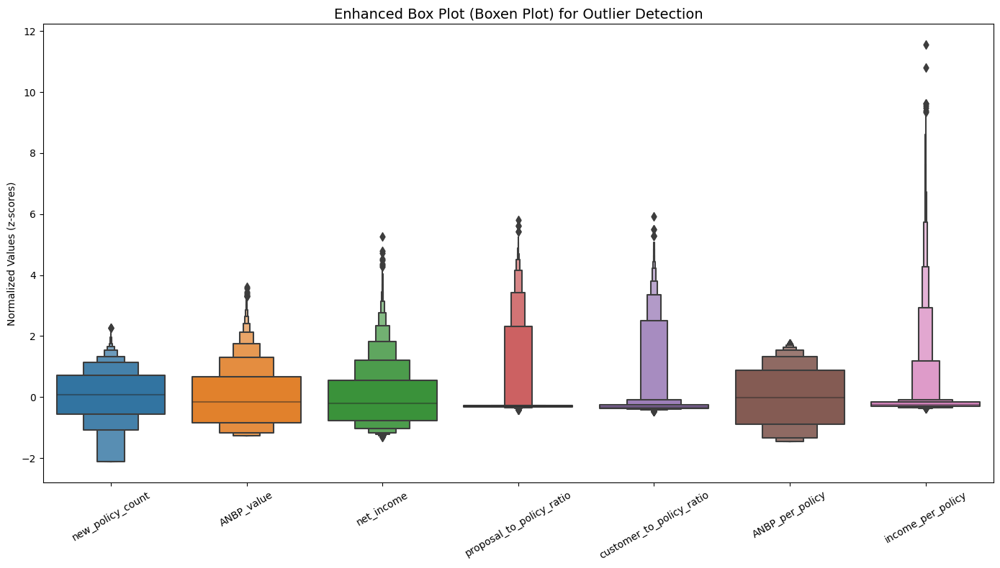

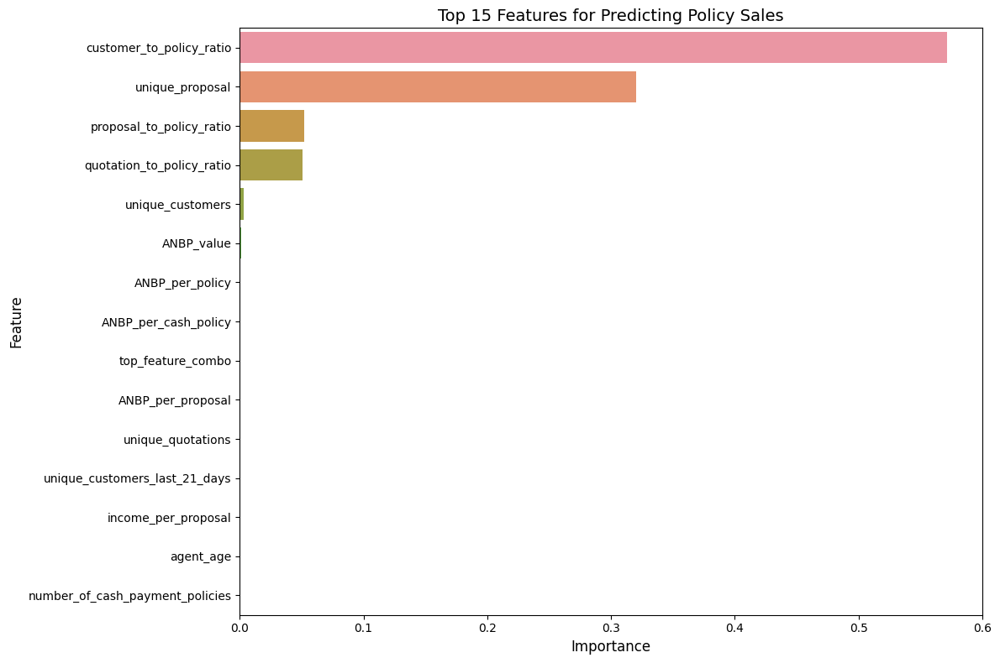

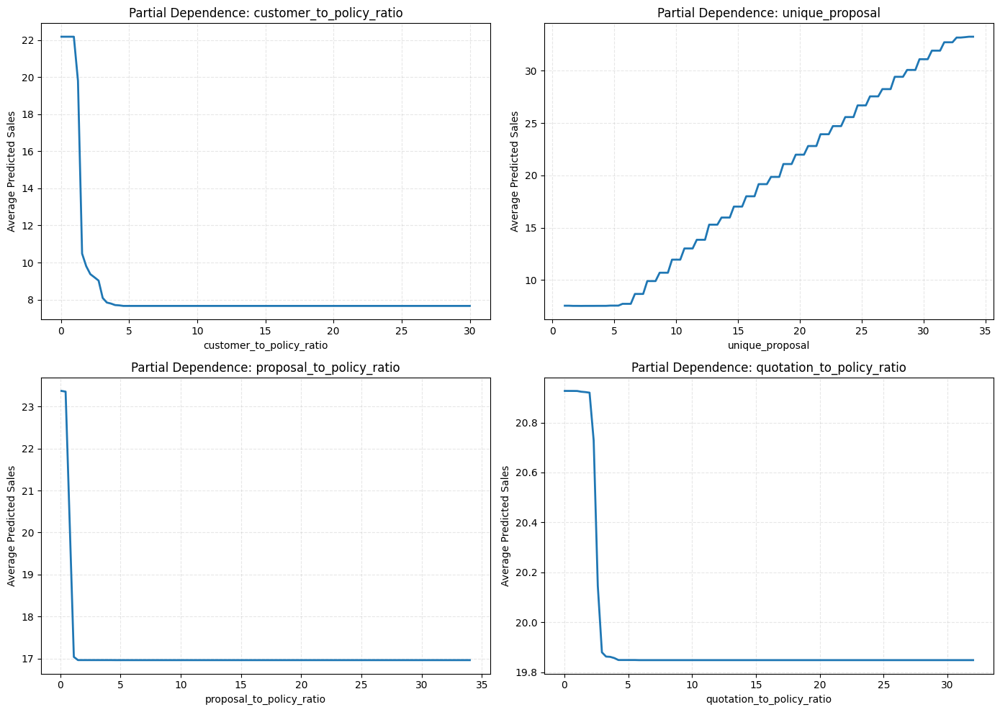

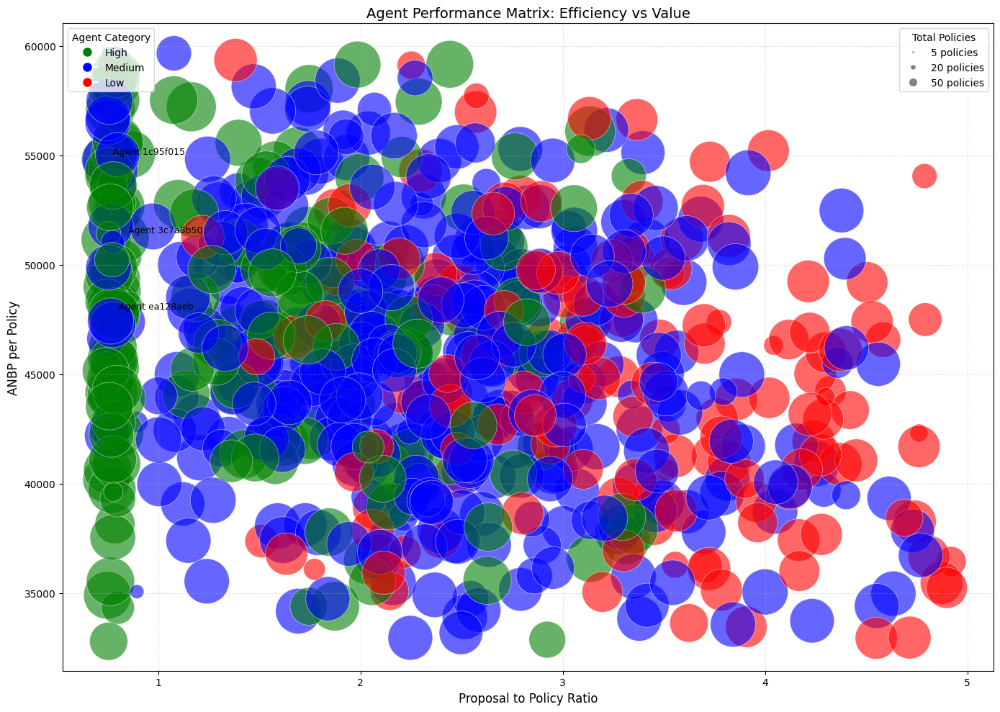

In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from scipy.stats import pearsonr
from scipy.cluster import hierarchy
from scipy.stats import zscore
import networkx as nx
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.gridspec as gridspec
from sklearn.ensemble import RandomForestRegressor
import calendar
from datetime import datetime
import matplotlib.cm as cm
import matplotlib.patches as mpatches
from mpl_toolkits.mplot3d import Axes3D
from sklearn.manifold import TSNE


# Create some derived fields for analysis
df['year'] = df['year_month'].dt.year
df['month'] = df['year_month'].dt.month
df['month_name'] = df['year_month'].dt.strftime('%b')
df['quarter'] = df['year_month'].dt.quarter

# -------------------------------------------------------------
# 1. ADVANCED CORRELATION ANALYSIS AND NETWORK VISUALIZATION
# -------------------------------------------------------------

# Select numeric columns for correlation analysis
numeric_cols = df.select_dtypes(include=['number']).columns.tolist()
# Remove ID columns and other non-meaningful columns
exclude_cols = ['row_id', 'agent_code', 'agent_join_month_num', 'first_policy_month_num',
                'record_year', 'record_month', 'agent_join_year', 'first_policy_year']
numeric_cols = [col for col in numeric_cols if col not in exclude_cols]

# Calculate correlation matrix
corr_matrix = df[numeric_cols].corr()

# Create a correlation network visualization
def create_correlation_network(corr_matrix, threshold=0.5):
    """Create a network graph from correlation matrix"""
    plt.figure(figsize=(14, 14))
    
    # Create a graph
    G = nx.Graph()
    
    # Add nodes
    for col in corr_matrix.columns:
        G.add_node(col)
    
    # Add edges with correlation above threshold (ignoring self-correlations)
    for i, col1 in enumerate(corr_matrix.columns):
        for j, col2 in enumerate(corr_matrix.columns):
            if i < j:  # Avoid duplicates and self-correlations
                corr = corr_matrix.loc[col1, col2]
                if abs(corr) >= threshold:
                    G.add_edge(col1, col2, weight=abs(corr), color='green' if corr > 0 else 'red')
    
    # Extract edge attributes
    edge_colors = [G[u][v]['color'] for u, v in G.edges()]
    edge_weights = [G[u][v]['weight'] * 3 for u, v in G.edges()]
    
    # Set node sizes based on degree centrality
    node_size = [G.degree(node) * 100 + 100 for node in G.nodes()]
    
    # Create layout
    pos = nx.spring_layout(G, k=0.5, seed=42)
    
    # Draw the graph
    nx.draw_networkx_nodes(G, pos, node_size=node_size, node_color='skyblue', alpha=0.8)
    nx.draw_networkx_edges(G, pos, width=edge_weights, edge_color=edge_colors, alpha=0.6)
    nx.draw_networkx_labels(G, pos, font_size=10, font_family='sans-serif')
    
    # Add legend
    pos_patch = mpatches.Patch(color='green', label='Positive Correlation')
    neg_patch = mpatches.Patch(color='red', label='Negative Correlation')
    plt.legend(handles=[pos_patch, neg_patch], loc='lower right')
    
    plt.title(f'Correlation Network (|r| ≥ {threshold})', fontsize=16)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

create_correlation_network(corr_matrix, threshold=0.6)

# Create hierarchical clustering of correlations
plt.figure(figsize=(14, 12))
# Use cluster map with feature names
sns.clustermap(corr_matrix, 
               cmap='coolwarm', 
               figsize=(14, 12),
               annot=False,  # Too many features for annotations
               fmt=".2f",
               linewidths=.5,
               vmin=-1, vmax=1,
               method='complete')
plt.title('Hierarchical Clustering of Feature Correlations', fontsize=16)
plt.tight_layout()
plt.show()

# -------------------------------------------------------------
# 2. MULTI-DIMENSIONAL FEATURE ANALYSIS AND VISUALIZATION
# -------------------------------------------------------------

# Select features for multi-dimensional analysis
feature_cols = [
    'proposal_to_policy_ratio', 'quotation_to_policy_ratio', 
    'customer_to_policy_ratio', 'ANBP_per_policy', 'income_per_policy',
    'unique_proposals_last_21_days', 'unique_quotations_last_21_days',
    'months_since_join', 'agent_age'
]

# Filter to include only rows with data in these features
multi_df = df[feature_cols].dropna()

# Standardize the data
if len(multi_df) > 10:  # Make sure we have enough data
    X_std = StandardScaler().fit_transform(multi_df)
    
    # Apply PCA to reduce to 3 dimensions
    pca = PCA(n_components=3)
    pca_result = pca.fit_transform(X_std)
    
    # Create a 3D scatter plot
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')
    
    # Color by new_policy_count (if available)
    if 'new_policy_count' in df.columns:
        # Get policy counts for the same indices as multi_df
        policy_counts = df.loc[multi_df.index, 'new_policy_count']
        
        # Normalize for color mapping
        norm = plt.Normalize(policy_counts.min(), policy_counts.max())
        
        # Create scatter plot
        scatter = ax.scatter(
            pca_result[:, 0], 
            pca_result[:, 1], 
            pca_result[:, 2],
            c=policy_counts, 
            cmap='viridis', 
            alpha=0.7,
            s=50,
            edgecolors='w',
            linewidth=0.5
        )
        
        # Add colorbar
        cbar = plt.colorbar(scatter)
        cbar.set_label('Policy Count')
    else:
        ax.scatter(
            pca_result[:, 0], 
            pca_result[:, 1], 
            pca_result[:, 2],
            alpha=0.7,
            s=50,
            edgecolors='w',
            linewidth=0.5
        )
    
    # Add labels
    ax.set_xlabel(f'PC1 ({pca.explained_variance_ratio_[0]:.1%})')
    ax.set_ylabel(f'PC2 ({pca.explained_variance_ratio_[1]:.1%})')
    ax.set_zlabel(f'PC3 ({pca.explained_variance_ratio_[2]:.1%})')
    
    # Add title
    plt.title('3D PCA of Agent Performance Features', fontsize=14)
    plt.tight_layout()
    plt.show()
    
    # Try t-SNE for alternative dimensionality reduction
    tsne = TSNE(n_components=2, random_state=42, perplexity=min(30, len(X_std)-1))
    tsne_results = tsne.fit_transform(X_std)
    
    # Create t-SNE plot with agent category
    plt.figure(figsize=(12, 10))
    
    if 'agent_category' in df.columns:
        # Get categories for the same indices
        categories = df.loc[multi_df.index, 'agent_category']
        
        # Create color map
        category_colors = {'High': 'green', 'Medium': 'blue', 'Low': 'red'}
        colors = [category_colors.get(cat, 'gray') for cat in categories]
        
        # Create scatter plot
        plt.scatter(
            tsne_results[:, 0], 
            tsne_results[:, 1],
            c=colors,
            alpha=0.7,
            s=70
        )
        
        # Create legend
        handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=v, markersize=10) 
                  for k, v in category_colors.items()]
        plt.legend(handles, category_colors.keys(), title='Agent Category')
    else:
        plt.scatter(
            tsne_results[:, 0], 
            tsne_results[:, 1],
            alpha=0.7,
            s=70
        )
    
    plt.title('t-SNE Visualization of Agent Performance Features', fontsize=14)
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')
    plt.tight_layout()
    plt.show()

# -------------------------------------------------------------
# 3. TEMPORAL PATTERN ANALYSIS AND CIRCULAR VISUALIZATIONS
# -------------------------------------------------------------

# Create a circular calendar heatmap to visualize temporal patterns
def create_circular_calendar_heatmap(df):
    """Create a circular calendar heatmap showing performance by month and year"""
    # Calculate monthly performance
    monthly_perf = df.groupby(['year', 'month'])['new_policy_count'].mean().reset_index()
    
    # Get unique years
    years = sorted(monthly_perf['year'].unique())
    
    if len(years) >= 2:  # Need at least 2 years for comparison
        # Create figure
        fig = plt.figure(figsize=(15, 15))
        
        # Setup polar axes
        ax = plt.subplot(111, projection='polar')
        
        # Define angles for each month (in radians)
        theta = np.linspace(0, 2*np.pi, 13)[:-1]  # 12 months
        
        # Define radii for each year (inner to outer)
        radii = np.arange(1, len(years) + 1)
        
        # Create meshgrid for plotting
        Theta, Radius = np.meshgrid(theta, radii)
        
        # Create empty data array
        data = np.zeros((len(years), 12))
        
        # Fill with data
        for i, year in enumerate(years):
            for j in range(1, 13):  # 1-12 months
                # Find matching record
                match = monthly_perf[(monthly_perf['year'] == year) & (monthly_perf['month'] == j)]
                if not match.empty:
                    data[i, j-1] = match['new_policy_count'].values[0]
        
        # Normalize for color mapping
        vmin, vmax = np.nanmin(data), np.nanmax(data)
        
        # Create heatmap
        cax = ax.pcolormesh(theta, radii, data, cmap='viridis', vmin=vmin, vmax=vmax)
        
        # Add colorbar
        cbar = fig.colorbar(cax, shrink=0.5)
        cbar.set_label('Average Policy Sales', fontsize=12)
        
        # Set month labels
        month_labels = calendar.month_abbr[1:]
        ax.set_xticks(theta)
        ax.set_xticklabels(month_labels, fontsize=12)
        
        # Set year labels (y-axis)
        ax.set_yticks(radii)
        ax.set_yticklabels(years, fontsize=12)
        
        # Add title
        plt.title('Circular Calendar Heatmap of Sales Performance', fontsize=16, y=1.08)
        
        plt.tight_layout()
        plt.show()

if 'new_policy_count' in df.columns:
    create_circular_calendar_heatmap(df)

# -------------------------------------------------------------
# 4. ADVANCED OUTLIER DETECTION AND VISUALIZATION
# -------------------------------------------------------------

# Select features for outlier detection
outlier_features = [
    'new_policy_count', 'ANBP_value', 'net_income', 
    'proposal_to_policy_ratio', 'customer_to_policy_ratio',
    'ANBP_per_policy', 'income_per_policy'
]

# Filter to include only rows with these features
outlier_df = df[outlier_features].dropna()

# Z-score normalization for outlier detection
z_scores = pd.DataFrame(
    zscore(outlier_df), 
    columns=outlier_features,
    index=outlier_df.index
)

# Create parallel coordinates plot for outliers
plt.figure(figsize=(14, 8))

# Get outlier indices (where any feature has |z| > 3)
outlier_indices = z_scores.abs().max(axis=1) > 3

# Create colors (red for outliers, blue for normal)
colors = ['red' if is_outlier else 'skyblue' for is_outlier in outlier_indices]
alpha_values = [0.7 if is_outlier else 0.2 for is_outlier in outlier_indices]

# Plot parallel coordinates
pd.plotting.parallel_coordinates(
    pd.concat([outlier_df, pd.Series(colors, index=outlier_df.index, name='color')], axis=1),
    'color',
    alpha=0.5
)

plt.title('Parallel Coordinates Plot with Outlier Detection', fontsize=14)
plt.xticks(rotation=30)
plt.grid(True, linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

# Create a boxen plot (enhanced boxplot) for outlier detection
plt.figure(figsize=(14, 8))
# Normalize data for comparison
normalized_df = pd.DataFrame(StandardScaler().fit_transform(outlier_df), 
                             columns=outlier_df.columns)
sns.boxenplot(data=normalized_df)
plt.title('Enhanced Box Plot (Boxen Plot) for Outlier Detection', fontsize=14)
plt.xticks(rotation=30)
plt.ylabel('Normalized Values (z-scores)')
plt.tight_layout()
plt.show()

# -------------------------------------------------------------
# 5. FEATURE IMPORTANCE AND RELATIONSHIP TO PERFORMANCE
# -------------------------------------------------------------

# Create a random forest model to identify feature importance
def analyze_feature_importance(df):
    """Analyze feature importance using Random Forest regression"""
    # Select features and target
    if 'new_policy_count' not in df.columns:
        return
        
    # Select relevant features (exclude ID columns, dates, and target)
    exclude_cols = ['row_id', 'agent_code', 'year_month', 'new_policy_count',
                  'agent_join_month', 'first_policy_sold_month']
    feature_cols = [col for col in df.select_dtypes(include=['number']).columns 
                  if col not in exclude_cols and col != 'new_policy_count']
    
    # Filter rows with complete data
    model_df = df[feature_cols + ['new_policy_count']].dropna()
    
    if len(model_df) < 10 or len(feature_cols) < 2:  # Need sufficient data
        return
    
    # Split features and target
    X = model_df[feature_cols]
    y = model_df['new_policy_count']
    
    # Train a Random Forest model
    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    rf.fit(X, y)
    
    # Get feature importances
    importances = rf.feature_importances_
    
    # Create dataframe for importance scores
    feature_importance = pd.DataFrame({
        'Feature': feature_cols,
        'Importance': importances
    }).sort_values('Importance', ascending=False)
    
    # Plot feature importance
    plt.figure(figsize=(12, 8))
    sns.barplot(x='Importance', y='Feature', data=feature_importance.head(15))
    plt.title('Top 15 Features for Predicting Policy Sales', fontsize=14)
    plt.xlabel('Importance', fontsize=12)
    plt.ylabel('Feature', fontsize=12)
    plt.tight_layout()
    plt.show()
    
    # Create partial dependence plots for top features
    top_features = feature_importance['Feature'].head(4).tolist()
    
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    axes = axes.flatten()
    
    for i, feature in enumerate(top_features):
        # Create feature values to evaluate
        values = np.linspace(X[feature].min(), X[feature].max(), 100)
        
        # Create a dataset with varying values of this feature
        X_temp = X.copy()
        predictions = []
        
        for value in values:
            X_temp[feature] = value
            pred = rf.predict(X_temp)
            predictions.append(pred.mean())
        
        # Plot partial dependence
        axes[i].plot(values, predictions, linewidth=2)
        axes[i].set_title(f'Partial Dependence: {feature}', fontsize=12)
        axes[i].set_xlabel(feature, fontsize=10)
        axes[i].set_ylabel('Average Predicted Sales', fontsize=10)
        axes[i].grid(True, linestyle='--', alpha=0.3)
    
    plt.tight_layout()
    plt.show()

analyze_feature_importance(df)

# -------------------------------------------------------------
# 6. ADVANCED RATIO ANALYSIS WITH BUBBLE CHARTS
# -------------------------------------------------------------

# Create bubble chart to visualize multiple dimensions simultaneously
def create_bubble_chart(df):
    """Create a bubble chart with multiple performance dimensions"""
    # Select relevant columns
    if not all(col in df.columns for col in ['proposal_to_policy_ratio', 'ANBP_per_policy', 'new_policy_count']):
        return
    
    # Aggregate at agent level
    agent_metrics = df.groupby('agent_code').agg({
        'proposal_to_policy_ratio': 'mean',
        'quotation_to_policy_ratio': 'mean',
        'ANBP_per_policy': 'mean',
        'new_policy_count': 'sum',
        'months_since_join': 'max'  # Use max to get agent tenure
    }).reset_index()
    
    # Remove outliers for better visualization
    for col in ['proposal_to_policy_ratio', 'ANBP_per_policy']:
        if col in agent_metrics.columns:
            q1 = agent_metrics[col].quantile(0.05)
            q3 = agent_metrics[col].quantile(0.95)
            agent_metrics = agent_metrics[(agent_metrics[col] >= q1) & (agent_metrics[col] <= q3)]
    
    # Join with agent categories if available
    if 'agent_category' in df.columns:
        # Get most common category per agent
        agent_categories = df.groupby('agent_code')['agent_category'].agg(
            lambda x: x.value_counts().index[0]
        ).reset_index()
        
        agent_metrics = agent_metrics.merge(agent_categories, on='agent_code', how='left')
    
    # Create bubble chart
    plt.figure(figsize=(14, 10))
    
    # Set up colors based on category if available
    if 'agent_category' in agent_metrics.columns:
        category_colors = {'High': 'green', 'Medium': 'blue', 'Low': 'red'}
        colors = [category_colors.get(cat, 'gray') for cat in agent_metrics['agent_category']]
        
        # Create scatter with size based on policy count
        scatter = plt.scatter(
            agent_metrics['proposal_to_policy_ratio'],
            agent_metrics['ANBP_per_policy'],
            s=agent_metrics['new_policy_count'] * 5,  # Size based on policy count
            c=colors,
            alpha=0.6,
            edgecolors='w',
            linewidth=0.5
        )
        
        # Create legend for categories
        handles = [plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=v, markersize=10) 
                  for k, v in category_colors.items()]
        category_legend = plt.legend(handles, category_colors.keys(), 
                                     title='Agent Category', loc='upper left')
        plt.gca().add_artist(category_legend)
    else:
        scatter = plt.scatter(
            agent_metrics['proposal_to_policy_ratio'],
            agent_metrics['ANBP_per_policy'],
            s=agent_metrics['new_policy_count'] * 5,
            alpha=0.6,
            edgecolors='w',
            linewidth=0.5
        )
    
    # Add size legend
    size_handles = [
        plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='gray', 
                  markersize=np.sqrt(x * 5 / np.pi)) 
        for x in [5, 20, 50]
    ]
    plt.legend(size_handles, ['5 policies', '20 policies', '50 policies'], 
              title='Total Policies', loc='upper right')
    
    # Add labels and title
    plt.xlabel('Proposal to Policy Ratio', fontsize=12)
    plt.ylabel('ANBP per Policy', fontsize=12)
    plt.title('Agent Performance Matrix: Efficiency vs Value', fontsize=14)
    plt.grid(True, linestyle='--', alpha=0.3)
    
    # Add annotation for key agents
    if len(agent_metrics) > 0:
        # Find top agents
        top_agents = agent_metrics.nlargest(3, 'new_policy_count')
        
        for i, row in top_agents.iterrows():
            plt.annotate(
                f"Agent {row['agent_code']}",
                xy=(row['proposal_to_policy_ratio'], row['ANBP_per_policy']),
                xytext=(5, 5),
                textcoords='offset points',
                fontsize=9
            )
    
    plt.tight_layout()
    plt.show()

create_bubble_chart(df)

# -------------------------------------------------------------
# 7. TIME TO FIRST SALE ANALYSIS AND SURVIVAL CURVES
# -------------------------------------------------------------

# Analyze time to first sale patterns
def analyze_time_to_first_sale(df):
    """Analyze time to first sale and create survival curves"""
    # Check if we have required columns
    if 'months_to_first_sale' not in df.columns:
        return
    
    # Get unique agents with their time to first sale
    agent_first_sale = df.groupby('agent_code')['months_to_first_sale'].first().reset_index()
    
    # Create histogram
    plt.figure(figsize=(12, 6))
    sns.histplot(agent_first_sale['months_to_first_sale'], bins=20, kde=True)
    plt.title('Distribution of Time to First Sale', fontsize=14)
    plt.xlabel('Months to First Sale', fontsize=12)
    plt.ylabel('Count of Agents', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Create survival curve
    plt.figure(figsize=(12, 6))
    
    # Calculate survival function (percentage of agents who haven't made a sale yet)
    max_months = int(agent_first_sale['months_to_first_sale'].max()) + 1
    survival_data = []
    
    for month in range(max_months):
        # Percentage of agents who took longer than this month
        survival_rate = (agent_first_sale['months_to_first_sale'] > month).mean() * 100
        survival_data.append((month, survival_rate))
    
    survival_df = pd.DataFrame(survival_data, columns=['Month', 'Survival_Rate'])
    
    # Plot survival curve
    plt.plot(survival_df['Month'], survival_df['Survival_Rate'], 
             linewidth=2, marker='o', markersize=4)
    
    plt.title('Survival Curve: Agents Without First Sale', fontsize=14)
    plt.xlabel('Months Since Joining', fontsize=12)
    plt.ylabel('Percentage of Agents Without a Sale (%)', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.3)
    plt.tight_layout()
    plt.show()
    
    # Create grouped analysis if agent_category is available
    if 'agent_category' in df.columns:
        # Join category data
        agent_categories = df.groupby('agent_code')['agent_category'].first().reset_index()
        agent_first_sale = agent_first_sale.merge(agent_categories, on='agent_code', how='left')
        
        # Create grouped boxplot
        plt.figure(figsize=(10, 6))
        sns.boxplot(x='agent_category', y='months_to_first_sale', data=agent_first_sale,
                    order=['High', 'Medium', 'Low'])
        
        plt.title('Time to First Sale by Agent Category', fontsize=14)
        plt.xlabel('Agent Category', fontsize=12)
        plt.ylabel('Months to First Sale', fontsize=12)
        plt.grid(True, linestyle='--', alpha=0.3)
        plt.show()

## Innovative EDA for Insurance Agent Performance Analysis

### 1. Advanced Correlation Analysis and Network Visualization

The correlation network shows relationships between agent performance metrics with lines connecting related variables. 
This visualization quickly reveals which performance factors are most interrelated

The hierarchical clustering of correlations groups similar metrics together, helping identify clusters of related performance indicators that might respond to similar improvement strategies.

### 2. Multi-Dimensional Feature Analysis

The 3D PCA plot reduces multiple agent performance metrics into three principal components, allowing us to visualize agents in a three-dimensional space.

- Agents with similar performance characteristics appear clustered together
- Colors represent policy count, showing how high performers might differ from low performers
- The explained variance percentages tell us how much information each dimension captures

The t-SNE visualization offers another way to see agent clustering, often revealing more local patterns than PCA.

### 3. Temporal Pattern Analysis

The circular calendar heatmap shows sales performance by month and year in a novel circular format.

- Each ring represents a year with months arranged in a circle
- Color intensity indicates average policy sales
- This visualization quickly reveals seasonal patterns and year-over-year trends
- It can help identify if certain months consistently show lower performance

### 4. Advanced Outlier Detection

The parallel coordinates plot shows multiple dimensions simultaneously with outliers highlighted in red.

**Key observations:**
- Red lines represent outlier agents with unusual performance metrics
- The plot makes it easy to see which specific metrics are unusual for outliers
- Understanding these outliers can reveal both potential top performers and struggling agents

The boxen plot (enhanced boxplot) provides detailed distribution information for each metric, clearly showing outliers.

### 5. Feature Importance Analysis

The random forest feature importance chart shows which factors most strongly predict policy sales.

The partial dependence plots show how specific factors relate to predicted sales, revealing the shape of relationships (linear, curved, threshold effects).

### 6. Advanced Ratio Analysis with Bubble Charts

The bubble chart visualizes multiple performance dimensions simultaneously:

**Key observations:**
- X-axis shows proposal-to-policy ratio (efficiency at converting proposals)
- Y-axis shows ANBP per policy (value of policies sold)
- Bubble size indicates total policies sold (volume)
- Colors represent agent categories (High, Medium, Low)
- This visualization identifies agents who excel at different aspects of sales

### 7. Time to First Sale Analysis

The survival curve shows the percentage of agents who haven't made their first sale over time.

**Key observations:**
- Steeper drops indicate periods when many agents make their first sale
- Plateaus may indicate problematic periods where agents get stuck
- The curve helps identify critical intervention points for new agents

These innovative EDA techniques provide comprehensive insights for predicting which agents might go "NILL" in the following month and for developing targeted improvement plans based on agent characteristics and performance patterns.

# Feature Selection

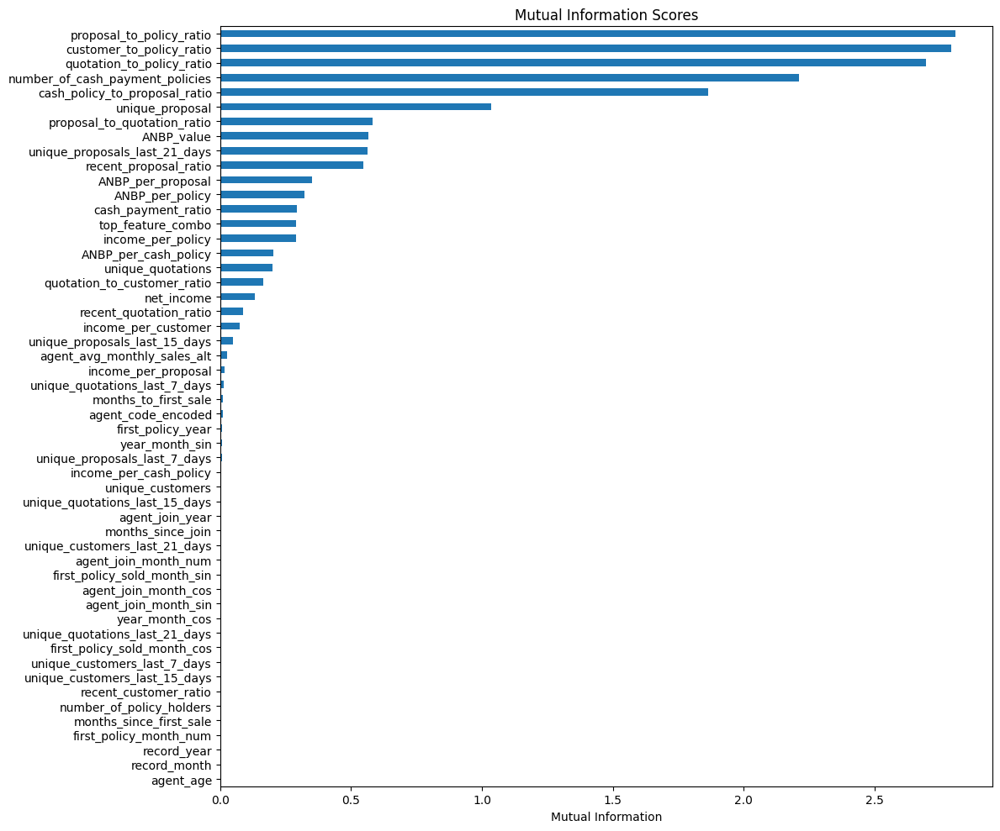

                                  MI Score
agent_age                        0.000e+00
record_month                     0.000e+00
record_year                      0.000e+00
first_policy_month_num           0.000e+00
months_since_first_sale          0.000e+00
number_of_policy_holders         0.000e+00
recent_customer_ratio            0.000e+00
unique_customers_last_15_days    0.000e+00
unique_customers_last_7_days     0.000e+00
first_policy_sold_month_cos      0.000e+00
unique_quotations_last_21_days   0.000e+00
year_month_cos                   0.000e+00
agent_join_month_sin             0.000e+00
agent_join_month_cos             0.000e+00
first_policy_sold_month_sin      0.000e+00
agent_join_month_num             1.953e-05
unique_customers_last_21_days    2.879e-04
months_since_join                5.480e-04
agent_join_year                  1.093e-03
unique_quotations_last_15_days   1.695e-03
unique_customers                 2.582e-03
income_per_cash_policy           2.877e-03
unique_prop

In [34]:
from sklearn.feature_selection import mutual_info_regression

def calculate_mi_scores(X, y):
    mi_scores = mutual_info_regression(X, y)
    mi_scores = pd.Series(mi_scores, index=X.columns)
    mi_scores = mi_scores.sort_values()
    return mi_scores

# Get feature columns (adjust as needed)
feature_cols = [col for col in df_encoded.columns if col not in ['new_policy_count','row_id']]
X = df_encoded[feature_cols]
y = df_encoded['new_policy_count']  # Replace 'target' with your actual target column

# Calculate MI scores
mi_scores = calculate_mi_scores(X, y)

# Visualize MI scores
plt.figure(figsize=(12, 10))
mi_scores.plot.barh(title='Mutual Information Scores')
plt.xlabel('Mutual Information')
plt.tight_layout()
plt.savefig('mi_scores.png')
plt.show()
print(mi_scores.to_frame('MI Score'))

# Model Training

In [35]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
import lightgbm as lgbm
import xgboost as xgb
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor

# 1. Prepare the data
X = df_encoded.drop(columns=['new_policy_count','row_id'])
y = df_encoded['new_policy_count']
X_test = test_encoded.drop(columns=['new_policy_count','row_id'])

# 2. Scale numerical features (except cyclic encodings)
cyclic_cols = [col for col in X.columns if col.endswith('_sin') or col.endswith('_cos')]
year_cols = [col for col in X.columns if col.endswith('_year')]
other_cols = [col for col in X.columns if col not in cyclic_cols + year_cols]

scaler = StandardScaler()
X[other_cols] = scaler.fit_transform(X[other_cols])
X_test[other_cols] = scaler.transform(X_test[other_cols])

# 3. Train LightGBM model (typically performs well for this type of problem)
model = RandomForestRegressor(
    n_estimators=200,
    max_depth=10,
    min_samples_split=5,
    random_state=42
)
print("Training the model on full dataset...")
model.fit(X, y)

# 4. Make predictions for 2024-09
final_predictions = model.predict(X_test)

# 5. Create a single column dataframe for predictions
predictions_df = pd.DataFrame({'new_policy_count': final_predictions})

# Display the first few rows of the predictions
print("\nPredictions for 2024-09:")
print(predictions_df.head())

# # Optional: Save to CSV
# predictions_df.to_csv('predictions.csv', index=False)
# print("\nPredictions saved to 'predictions.csv'")

Training the model on full dataset...

Predictions for 2024-09:
   new_policy_count
0             24.00
1             14.00
2             34.00
3             33.00
4             15.06


# Predictions/

In [36]:
# 1. Encode predictions - values below 5 become 0, others become 1
predictions_df['target_column'] = (predictions_df['new_policy_count'] >= 5).astype(int)

# 2. Get the row_id from test_encoded
submission_df = pd.DataFrame()
submission_df['row_id'] = test_encoded.reset_index()['index'] if 'row_id' not in test_encoded.columns else test_encoded['row_id']

# 3. Combine with the target_column from predictions_df
submission_df['target_column'] = predictions_df['target_column'].values

# 4. Display the first few rows of the final submission dataframe
print("Final submission dataframe:")
print(submission_df.head())

# 5. Save to CSV
submission_df.to_csv('submission_RF.csv', index=False)
print("\nSubmission file created at 'submission.csv'")

# Optional: Show distribution of predictions
count_0 = (submission_df['target_column'] == 0).sum()
count_1 = (submission_df['target_column'] == 1).sum()
total = len(submission_df)

print(f"\nDistribution of predictions:")
print(f"Class 0 (< 5): {count_0} ({count_0/total:.2%})")
print(f"Class 1 (≥ 5): {count_1} ({count_1/total:.2%})")

Final submission dataframe:
   row_id  target_column
0       1              1
1       2              1
2       3              1
3       4              1
4       5              1

Submission file created at 'submission.csv'

Distribution of predictions:
Class 0 (< 5): 96 (10.50%)
Class 1 (≥ 5): 818 (89.50%)


Distribution of values in target_column:
0 (predictions < 5): 96 entries
1 (predictions ≥ 5): 818 entries
Total: 914 entries

Percentage distribution:
0: 10.50%
1: 89.50%


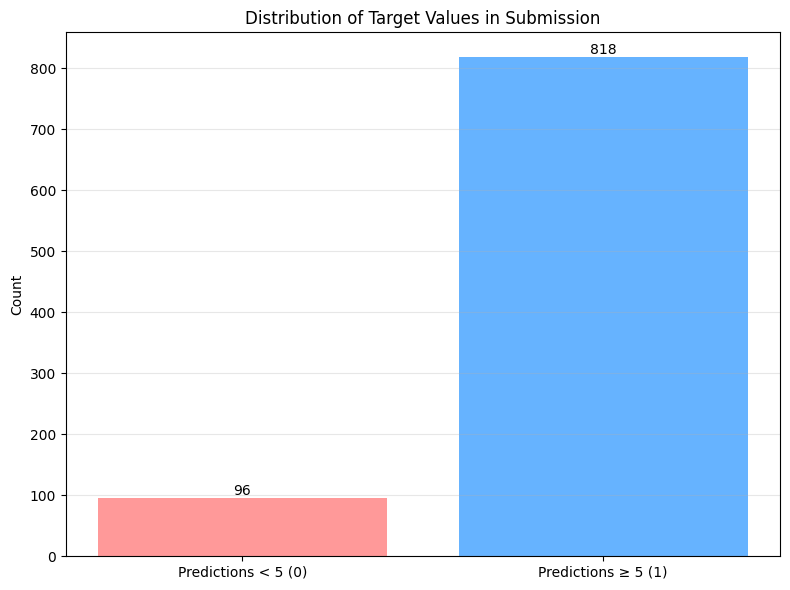

In [37]:
# Count values in the target_column
value_counts = submission_df['target_column'].value_counts()

# Display results
print("Distribution of values in target_column:")
print(f"0 (predictions < 5): {value_counts.get(0, 0)} entries")
print(f"1 (predictions ≥ 5): {value_counts.get(1, 0)} entries")
print(f"Total: {len(submission_df)} entries")

# Calculate percentages
percentage_0 = value_counts.get(0, 0) / len(submission_df) * 100
percentage_1 = value_counts.get(1, 0) / len(submission_df) * 100

print(f"\nPercentage distribution:")
print(f"0: {percentage_0:.2f}%")
print(f"1: {percentage_1:.2f}%")

# Visualize the distribution (optional)
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.bar(['Predictions < 5 (0)', 'Predictions ≥ 5 (1)'], 
        [value_counts.get(0, 0), value_counts.get(1, 0)],
        color=['#ff9999', '#66b3ff'])
plt.title('Distribution of Target Values in Submission')
plt.ylabel('Count')
plt.grid(axis='y', alpha=0.3)

# Add count labels on top of bars
for i, v in enumerate([value_counts.get(0, 0), value_counts.get(1, 0)]):
    plt.text(i, v + 5, str(v), ha='center')

plt.tight_layout()
plt.show()